# Preamble

In [1]:
import os
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.sparse as sp
from scipy.stats import kruskal
from sklearn.preprocessing import StandardScaler
# from cca_zoo.linear import PLS, SCCA_IPLS

sc.settings.verbosity = 0
sc.set_figure_params(dpi=100, facecolor="white")
sc.set_figure_params(fontsize=20)
#sc.set_figure_params(fontsize=10)

h5ad_path = "data/Colon_cell_atlas.h5ad"
meta_path = "data/Colon_immune_metadata.csv"
mtx_path = "data/Colon_immune_counts.mtx"
mtx_gene_path = "data/Colon_immune_gene_names.csv"

In [2]:
%%capture

adata = sc.read_h5ad(h5ad_path)
meta = pd.read_csv(meta_path)
mtx = sc.read_mtx(mtx_path)
mtx_gene_name = pd.read_csv(mtx_gene_path)["index"].astype(str).values

print("adata.X shape:", adata.X.shape)
print("obs columns:", list(adata.obs.columns))
print("var columns:", list(adata.var.columns))


In [3]:
adata_gene_names = adata.var_names.astype(str).values
gene_to_idx = {g: i for i, g in enumerate(mtx_gene_name)}

X_counts = mtx.X.tocsr()
col_idx = np.array([gene_to_idx[g] for g in adata_gene_names])
X_counts_sub = X_counts[:, col_idx]

assert X_counts_sub.shape == adata.shape
adata.layers["counts"] = X_counts_sub.copy()

In [4]:
cd4_types = [
    "Activated CD4 T",
    "Tcm",
    "Tfh",
    "Th1",
    "Th17",
    "Treg",
]

b_types = [
    "B cell memory",
    "Follicular B cell",
    "B cell IgA Plasma",
    "B cell IgG Plasma",
    "B cell cycling",
]

# Cytotoxic / innate-lymphoid lineage (lymphocyte programs apply)
cytolymph_types = [
    "CD8 T",
    "NK",
    "gd T",
    "cycling gd T",
    "ILC",
]

# Myeloid / antigen-presenting / mast lineage (myeloid programs apply)
myeloid_types = [
    "LYVE1 Macrophage",
    "Macrophage",
    "Monocyte",
    "Lymphoid DC",
    "cDC1",
    "cDC2",
    "cycling DCs",
    "pDC",
    "Mast",
]

# Backwards-compatible union for cell-type-agnostic uses (UMAP, all-cell proportions)
other_types = cytolymph_types + myeloid_types


In [5]:
celltype_colors = {
    "Activated CD4 T": "#C0392B",
    "Tcm":             "#E8836A",
    "Tfh":             "#F0A875",
    "Th1":             "#F5C98A",
    "Th17":            "#D4622A",
    "Treg":            "#8B2500",

    "B cell memory":       "#2E8B7A",
    "Follicular B cell":   "#1A5C9E",
    "B cell IgA Plasma":   "#7B5EA7",
    "B cell IgG Plasma":   "#C47AB0",
    "B cell cycling":      "#0D3B2E",

    "CD8 T":            "#4A4580",
    "cDC1":             "#7B68C8",
    "cDC2":             "#A89FD8",
    "cycling DCs":      "#C8C3E8",
    "ILC":              "#5A9E6F",
    "gd T":             "#3A7A50",
    "cycling gd T":     "#A0CCA8",
    "Lymphoid DC":      "#7DB08A",
    "NK":               "#2C5F3A",
    "Monocyte":         "#9C8E7A",
    "Mast":             "#C4956A",
    "Macrophage":       "#6B5B45",
    "LYVE1 Macrophage": "#B5A48A",
    "pDC":              "#7A4060",
}

## Curated Gene Sets

In [6]:
gene_sets = {
    "Th1_program": [
        "TBX21", "IFNG", "CXCR3", "STAT4", "IL12RB2",
        "CCL4", "XCL1", "CTSW", "GZMK",
    ],
    "Th17_program": [
        "RORC", "IL17A", "IL17F", "IL22", "CCR6",
        "CCL20", "IL23R", "IRF4", "CXCR6", "FURIN",
    ],
    "Treg_core": [
        "FOXP3", "IL2RA", "CTLA4", "IKZF2", "TIGIT",
        "ICOS", "LAG3", "TNFRSF18", "IL10", "BATF",
    ],
    "Tfh_program": [
        "CXCR5", "ICOS", "PDCD1", "IL21", "BCL6",
        "MAF", "SH2D1A", "CD40LG", "TOX2", "TIGIT",
    ],
    "Tcm_recirculation": [
        "SELL", "CCR7", "TCF7", "LEF1", "IL7R",
        "KLF2", "S1PR1", "LTB", "MAL", "FOXO1",
    ],
    "Sigmoid_Teff_activation": [
        "TANK", "CD83", "PIM3", "BCL2A1", "MAP3K8",
        "IRF9", "STAT1", "NFKB1", "JUNB", "FOS",
    ],

    # Lymphocyte tissue residency (was Tissue_residency) — TRM / NK / ILC program
    "Lymphocyte_tissue_residency": [
        "CD69", "ITGAE", "CXCR6", "ZNF683", "BHLHE40",
        "RGS1", "PRDM1", "CXCR3", "IFNG", "CTSW",
    ],

    # B cell modules (refactored: identity / differentiation / signaling /
    # gut-homing receptors / plasma-specific homing / tissue residency)

    # Naive + follicular B identity (CD27 absent → biased toward naive/follicular)
    "Memory_follicular_B": [
        "MS4A1", "CD19", "CD40", "TNFRSF13B", "CXCR5",
        "FCER2", "TCL1A", "HLA-DRA",
    ],
    # Terminal differentiation: surface, master TFs, secretion machinery
    "Plasma_cell_terminal": [
        "SDC1", "CD38", "TNFRSF17", "PRDM1", "XBP1",
        "MZB1", "JCHAIN", "SSR4", "FKBP11", "DERL3",
    ],
    # Universal gut-homing receptors — applied to ALL B cell types
    "B_cell_gut_homing": [
        "CCR9", "CCR10", "ITGA4", "ITGB7",
    ],
    # Plasma-cell-specific gut homing (precursor + adhesion context) — plasma only
    "Plasma_homing_IgA": [
        "CCR9", "CCR10", "ITGA4", "ITGB7", "CD27", "ITGB1",
    ],
    # BCR proximal signaling (no migration leakage)
    "Proximal_BCR_activation": [
        "CD79A", "CD79B", "SYK", "BLNK", "BTK",
        "EGR1", "EGR2", "CCL3", "CCL4",
    ],
    # B cell tissue residency — tightened: dropped CD69 (dual activation/retention,
    # was contaminating the score with NFkB-driven activation signal in this
    # tissue-only dataset). Added GPR183 (EBI2), a B-cell-specific follicle
    # positioning receptor. Applied only to memory + plasma cells via the
    # celltype map (where retention vs migration is biologically informative).
    "B_cell_residency": [
        "ZNF683", "CXCR6", "RGS1", "GPR183",
    ],

    # Universal / shared programs
    "Interferon_response": [
        "STAT1", "IRF1", "IRF9", "GBP1", "GBP2",
        "CXCL10", "IDO1", "B2M", "TAP1", "PSMB9",
    ],

    # Split TNFR_NFkB_activation:
    # NF-kB downstream genes — universal across hematopoietic cells
    "NFkB_activation": [
        "NFKBIA", "TNFAIP3", "RELB", "TANK", "BCL2A1",
        "TRAF1", "NFKB1", "NFKB2", "REL",
    ],
    # TNFR-family costimulation receptors — T-cell-restricted
    # (TNFRSF4 = OX40; OX40 alias removed to avoid duplication)
    "TNFR_costimulation": [
        "TNFRSF4", "TNFRSF9", "TNFRSF18", "TNFRSF1B",
        "ICOS", "CD40LG",
    ],

    "IL10_STAT3_anti_inflammatory": [
        "IL10", "IL10RA", "IL10RB", "STAT3", "SOCS3",
        "SOCS1", "IL1RN", "HMOX1", "MAF", "TGFB1",
    ],
    "Metallothionein_metal_response": [
        "MT1A", "MT1E", "MT1F", "MT1G", "MT1H",
        "MT1X", "MT2A", "HMOX1", "FTL", "FTH1",
    ],
    "Fatty_acid_metabolism": [
        "ACAA1", "ACSL5", "PDK4", "FABP5", "CPT1A",
        "ACADM", "HADHA", "HADHB", "SLC27A2", "PPARA",
    ],
    "Oxidative_phosphorylation": [
        "NDUFA1", "NDUFB8", "NDUFS1", "UQCRB", "UQCRC1",
        "COX5A", "COX7A2", "COX17", "ATP5F1A", "CYCS",
    ],
    "RAC1_cytoskeletal": [
        "RAC1", "PAK2", "CFL1", "ARPC1B", "ARPC2",
        "ARPC3", "NCK1", "NCK2", "BCAR1", "ACTR3",
    ],
    "Integrin_adhesion": [
        "ITGA1", "ITGA4", "ITGAV", "ITGB1", "ITGB7",
        "VCL", "PXN", "PTK2B", "ILK", "TLN1",
    ],

    # Cytotoxic effector machinery — applies to CD8/NK/gd T (was NK_cytotoxicity)
    # Dropped NCR1 (NK-restricted) and XCL1/XCL2 (chemokines, not effector)
    "Cytotoxic_effector": [
        "PRF1", "GZMA", "GZMB", "GZMK", "GNLY",
        "NKG7", "KLRD1", "CTSW", "FCGR3A",
    ],
    # Myeloid acute inflammatory program — Mac/Mono/DC/Mast
    # (FCGR3A removed: it is an Fc receptor for ADCC/phagocytosis, not an
    # acute inflammatory mediator. Stays in Cytotoxic_effector for NK ADCC.)
    "Myeloid_inflammatory": [
        "IL1B", "TNF", "NFKBIA", "TNFAIP3", "CCL20",
        "CXCL8", "HLA-DRA", "CD14", "S100A8",
    ],
}


In [7]:
t_cell_gene_sets = {
    k: gene_sets[k] for k in [
        "Th1_program",
        "Th17_program",
        "Treg_core",
        "Tfh_program",
        "Tcm_recirculation",
        "Sigmoid_Teff_activation",
        "Lymphocyte_tissue_residency",
        "Interferon_response",
        "NFkB_activation",
        "TNFR_costimulation",
        "IL10_STAT3_anti_inflammatory",
        "RAC1_cytoskeletal",
        "Integrin_adhesion",
        "Oxidative_phosphorylation",
        "Fatty_acid_metabolism",
    ]
}

b_cell_gene_sets = {
    k: gene_sets[k] for k in [
        "Memory_follicular_B",
        "Plasma_cell_terminal",
        "Plasma_homing_IgA",
        "Proximal_BCR_activation",
        "B_cell_gut_homing",
        "B_cell_residency",
        "Interferon_response",
        "NFkB_activation",
        "Integrin_adhesion",
    ]
}

cytolymph_gene_sets = {
    k: gene_sets[k] for k in [
        "Cytotoxic_effector",
        "Lymphocyte_tissue_residency",
        "Interferon_response",
        "NFkB_activation",
        "IL10_STAT3_anti_inflammatory",
        "Integrin_adhesion",
        "Oxidative_phosphorylation",
    ]
}

myeloid_gene_sets = {
    k: gene_sets[k] for k in [
        "Myeloid_inflammatory",
        "Interferon_response",
        "NFkB_activation",
        "IL10_STAT3_anti_inflammatory",
        "Metallothionein_metal_response",
        "Fatty_acid_metabolism",
        "Oxidative_phosphorylation",
        "Integrin_adhesion",
    ]
}

# === Cell-type-specific pathway assignments ===
# Lineage-defining programs are restricted to their cell type;
# everything else is treated as universal across the lineage.

# T-cell universals (apply to ALL CD4 T types):
# - Lymphocyte residency, IFN, NFkB, IL10/STAT3, OXPHOS, FA, integrin (process modules)
# - Sigmoid_Teff_activation, TNFR_costimulation, RAC1_cytoskeletal:
#   activation/costim/migration programs that all T cells engage to varying degrees
_t_universal = [
    "Lymphocyte_tissue_residency",
    "Interferon_response",
    "NFkB_activation",
    "TNFR_costimulation",
    "IL10_STAT3_anti_inflammatory",
    "Sigmoid_Teff_activation",
    "RAC1_cytoskeletal",
    "Integrin_adhesion",
    "Oxidative_phosphorylation",
    "Fatty_acid_metabolism",
]

t_celltype_geneset_map = {
    "Th1":             ["Th1_program"] + _t_universal,
    "Th17":            ["Th17_program"] + _t_universal,
    "Treg":            ["Treg_core"] + _t_universal,
    "Tfh":             ["Tfh_program"] + _t_universal,
    "Tcm":             ["Tcm_recirculation"] + _t_universal,
    "Activated CD4 T": _t_universal,   # Sigmoid_Teff_activation now in universals
}

# B-cell universals:
# - B_cell_gut_homing, IFN, NFkB, Integrin (process modules)
# - Memory_follicular_B and Proximal_BCR_activation: B-lineage modules that
#   will naturally score high in memory/follicular and low in plasma — informative
#   across all B types.
# B-cell universals: applied to NON-PLASMA B cells (memory/follicular/cycling).
# Plasma cells get a parallel set with plasma-specific homing instead.
# B-cell universals applied to NON-PLASMA B cells (memory/follicular/cycling).
# Plasma cells get a parallel set with plasma-specific homing instead.
# B_cell_residency is scored only on memory + plasma cells (not follicular,
# which is intrinsically follicle-bound, or cycling, which is transient).
_b_universal_nonplasma = [
    "Memory_follicular_B",
    "B_cell_gut_homing",
    "Proximal_BCR_activation",
    "Interferon_response",
    "NFkB_activation",
    "Integrin_adhesion",
]

_b_universal_plasma = [
    "Plasma_cell_terminal",
    "Plasma_homing_IgA",
    "Proximal_BCR_activation",
    "B_cell_residency",
    "Interferon_response",
    "NFkB_activation",
    "Integrin_adhesion",
]

b_celltype_geneset_map = {
    "B cell memory":      _b_universal_nonplasma + ["B_cell_residency"],
    "Follicular B cell":  _b_universal_nonplasma,
    "B cell cycling":     _b_universal_nonplasma,
    "B cell IgA Plasma":  _b_universal_plasma,
    "B cell IgG Plasma":  [k for k in _b_universal_plasma if k != "Plasma_homing_IgA"],
}


# Aim 1

## UMAPs

In [8]:
sc.tl.umap(adata, random_state=42)

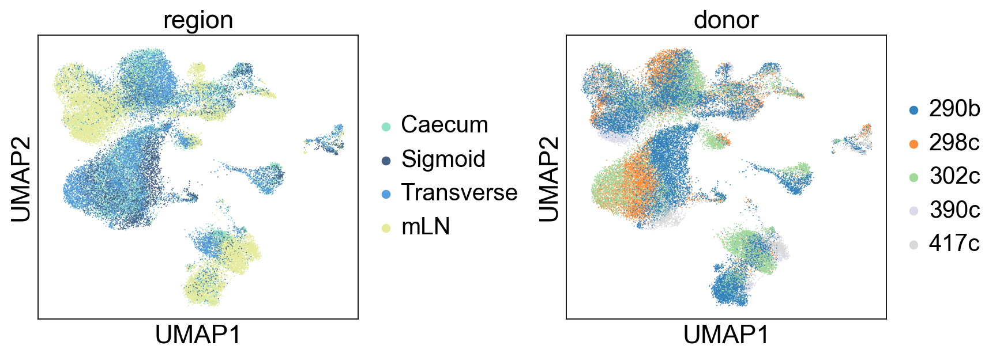

In [9]:
sc.pl.umap(
    adata,
    color=["region", "donor"],
    wspace=0.5,
    legend_loc="right margin"
)

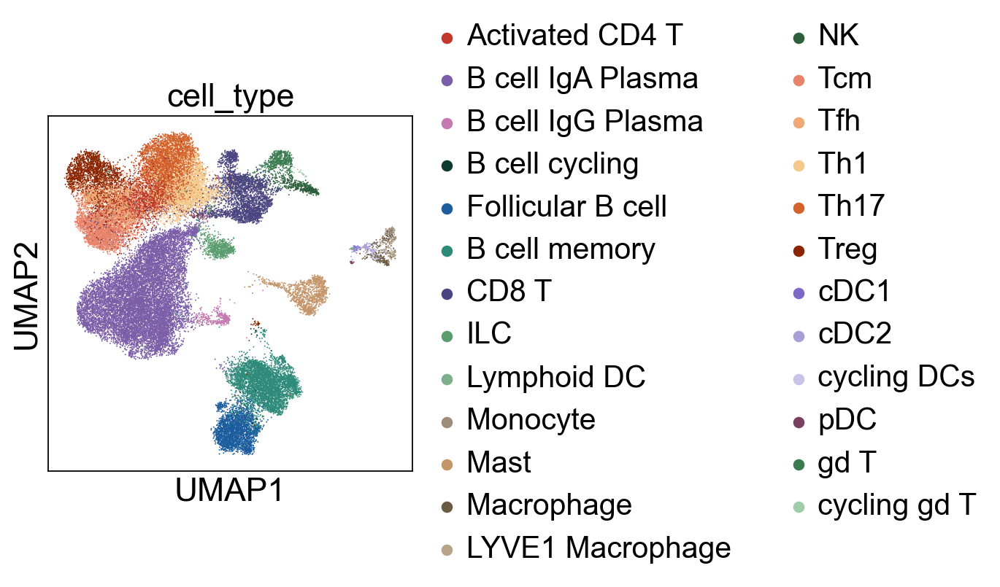

In [10]:
sc.pl.umap(adata, color="cell_type", palette=celltype_colors, legend_loc="right margin")

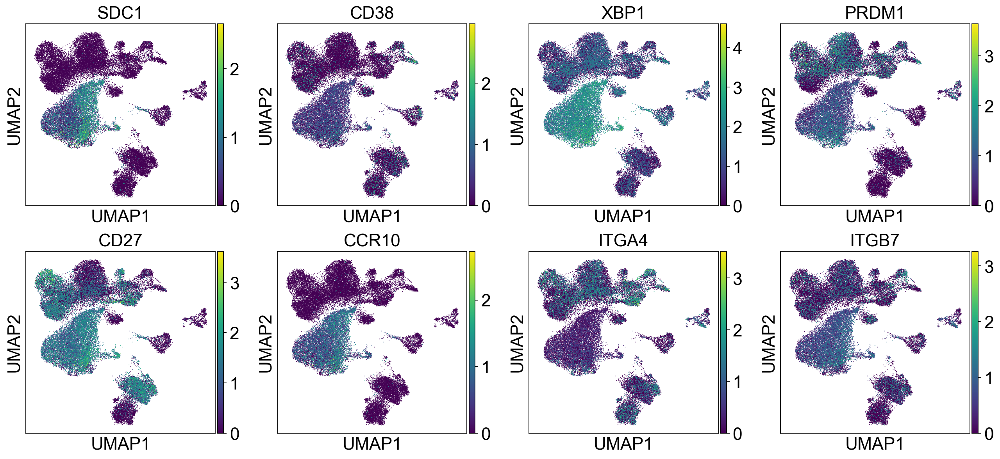

In [11]:
genes_b = ["SDC1", "CD38", "XBP1", "PRDM1", "CD27", "CCR10", "ITGA4", "ITGB7"]
sc.pl.umap(adata, color=genes_b, ncols=4, vmin=0)

## Barplots

In [12]:
def plot_fraction_bar(
    adata,
    keep_types,
    group_col="region",
    subtype_col="cell_type",
    group_order=None,
    type_order=None,
    color_dict=None,
    figsize=(5, 5),
    ylabel="Fraction of cells",
    sample_sep="_",
    drop_regions=None,
    flatten_sample_id=True,
):
    def _norm_donor(x):
        return str(x).strip().upper()

    def _norm_region(x):
        x = str(x).strip()
        mapping = {
            "Cecum": "Caecum",
            "cecum": "Caecum",
            "Caecum": "Caecum",
            "Transverse": "Transverse",
            "transverse": "Transverse",
            "Sigmoid": "Sigmoid",
            "sigmoid": "Sigmoid",
            "mLN": "mLN",
            "MLN": "mLN",
        }
        return mapping.get(x, x)

    def _make_sample_id_from_row(row, group_cols):
        if "donor" in group_cols and "region" in group_cols:
            return f"{_norm_donor(row['donor'])}{sample_sep}{_norm_region(row['region'])}"
        return sample_sep.join(str(row[c]).strip() for c in group_cols)

    if isinstance(group_col, str):
        group_cols = [group_col]
    else:
        group_cols = list(group_col)

    df = adata.obs.copy()
    df = df[df[subtype_col].isin(keep_types)].copy()

    if "donor" in df.columns:
        df["donor"] = df["donor"].map(_norm_donor)
    if "region" in df.columns:
        df["region"] = df["region"].map(_norm_region)

    if drop_regions is not None and "region" in df.columns:
        drop_regions = {_norm_region(x) for x in drop_regions}
        df = df[~df["region"].isin(drop_regions)].copy()

    ct = (
        df.groupby(group_cols + [subtype_col])
        .size()
        .reset_index(name="n_cells")
    )

    ct["fraction"] = ct.groupby(group_cols)["n_cells"].transform(lambda x: x / x.sum())

    ct_pivot = ct.pivot_table(
        index=group_cols,
        columns=subtype_col,
        values="fraction",
        fill_value=0
    )

    if type_order is not None:
        type_order = [t for t in type_order if t in ct_pivot.columns]
        ct_pivot = ct_pivot[type_order]

    # always flatten to donor_region if donor and region are present
    if flatten_sample_id and isinstance(ct_pivot.index, pd.MultiIndex):
        idx_df = ct_pivot.index.to_frame(index=False)

        if "donor" in group_cols and "region" in group_cols:
            flat_index = idx_df.apply(
                lambda row: f"{_norm_donor(row['donor'])}{sample_sep}{_norm_region(row['region'])}",
                axis=1
            )
            ct_pivot = ct_pivot.copy()
            ct_pivot.index = flat_index
            ct_pivot.index.name = "sample_id"

            if group_order is not None:
                normalized_group_order = []
                for x in group_order:
                    if isinstance(x, tuple) and len(x) == 2:
                        normalized_group_order.append(
                            f"{_norm_donor(x[0])}{sample_sep}{_norm_region(x[1])}"
                        )
                    else:
                        normalized_group_order.append(str(x))
                normalized_group_order = [g for g in normalized_group_order if g in ct_pivot.index]
                ct_pivot = ct_pivot.loc[normalized_group_order]
        else:
            flat_index = idx_df.astype(str).agg(sample_sep.join, axis=1)
            ct_pivot = ct_pivot.copy()
            ct_pivot.index = flat_index
            ct_pivot.index.name = sample_sep.join(group_cols)

    elif flatten_sample_id and not isinstance(ct_pivot.index, pd.MultiIndex):
        ct_pivot = ct_pivot.copy()
        ct_pivot.index = ct_pivot.index.astype(str)

        if group_order is not None and len(group_cols) == 1:
            group_order = [_norm_region(g) if group_cols[0] == "region" else str(g) for g in group_order]
            group_order = [g for g in group_order if g in ct_pivot.index]
            ct_pivot = ct_pivot.loc[group_order]

    colors = None
    if color_dict is not None:
        colors = [color_dict[c] for c in ct_pivot.columns]

    ax = ct_pivot.plot(
        kind="bar",
        stacked=True,
        figsize=figsize,
        width=0.8,
        color=colors
    )

    ax.set_axisbelow(True)
    ax.grid(axis="y", zorder=0)
    ax.set_ylabel(ylabel)
    ax.set_xlabel("")
    plt.xticks(rotation=45, ha="right")
    plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", frameon=False)
    plt.tight_layout()
    plt.show()

    return ct_pivot

region_order = ["Caecum", "Transverse", "Sigmoid", "mLN"]

/var/folders/_p/wlrwlb8j6zz_vb4ls4j_0fc00000gn/T/ipykernel_96625/2433639633.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(group_cols + [subtype_col])
/var/folders/_p/wlrwlb8j6zz_vb4ls4j_0fc00000gn/T/ipykernel_96625/2433639633.py:61: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ct["fraction"] = ct.groupby(group_cols)["n_cells"].transform(lambda x: x / x.sum())
/var/folders/_p/wlrwlb8j6zz_vb4ls4j_0fc00000gn/T/ipykernel_96625/2433639633.py:63: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False 

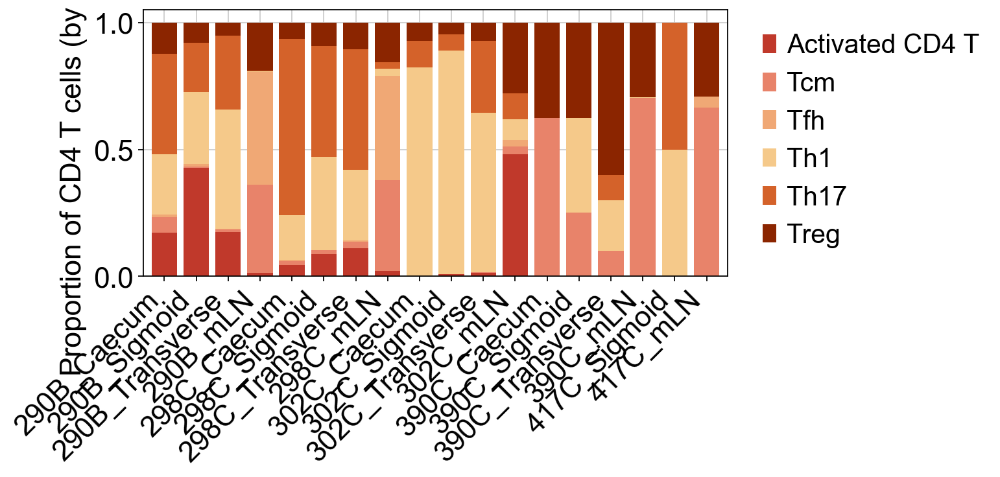

In [13]:
t_cell_proportion = plot_fraction_bar(
    adata,
    keep_types=cd4_types,
    group_col=["donor", "region"],
    type_order=cd4_types,
    color_dict=celltype_colors,
    figsize=(10, 5),
    ylabel="Proportion of CD4 T cells (by Donor)"
)

/var/folders/_p/wlrwlb8j6zz_vb4ls4j_0fc00000gn/T/ipykernel_96625/2433639633.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(group_cols + [subtype_col])
/var/folders/_p/wlrwlb8j6zz_vb4ls4j_0fc00000gn/T/ipykernel_96625/2433639633.py:61: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ct["fraction"] = ct.groupby(group_cols)["n_cells"].transform(lambda x: x / x.sum())
/var/folders/_p/wlrwlb8j6zz_vb4ls4j_0fc00000gn/T/ipykernel_96625/2433639633.py:63: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False 

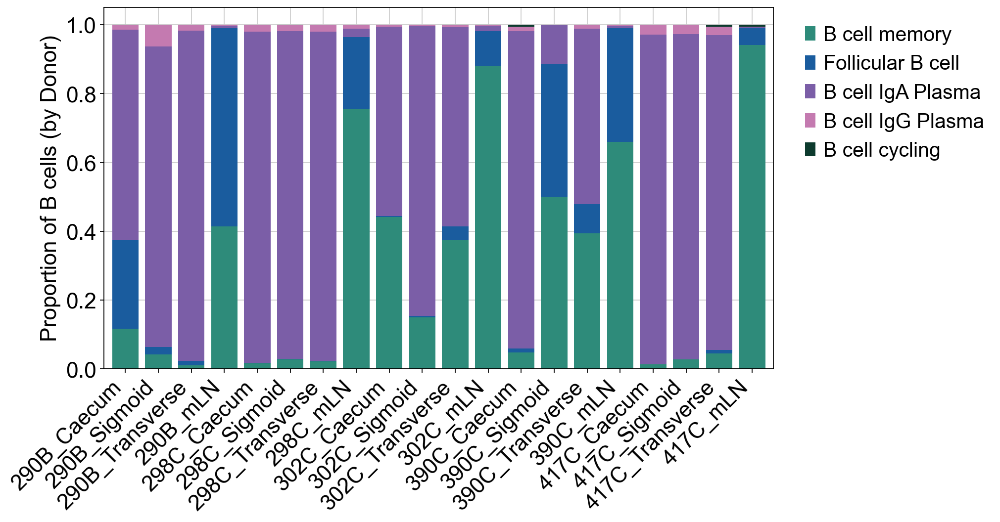

In [14]:
b_cell_proportion = plot_fraction_bar(
    adata,
    keep_types=b_types,
    group_col=["donor", "region"],
    type_order=b_types,
    color_dict=celltype_colors,
    figsize=(13, 7),
    ylabel="Proportion of B cells (by Donor)"
)

/var/folders/_p/wlrwlb8j6zz_vb4ls4j_0fc00000gn/T/ipykernel_96625/2433639633.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(group_cols + [subtype_col])
/var/folders/_p/wlrwlb8j6zz_vb4ls4j_0fc00000gn/T/ipykernel_96625/2433639633.py:61: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ct["fraction"] = ct.groupby(group_cols)["n_cells"].transform(lambda x: x / x.sum())
/var/folders/_p/wlrwlb8j6zz_vb4ls4j_0fc00000gn/T/ipykernel_96625/2433639633.py:63: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False 

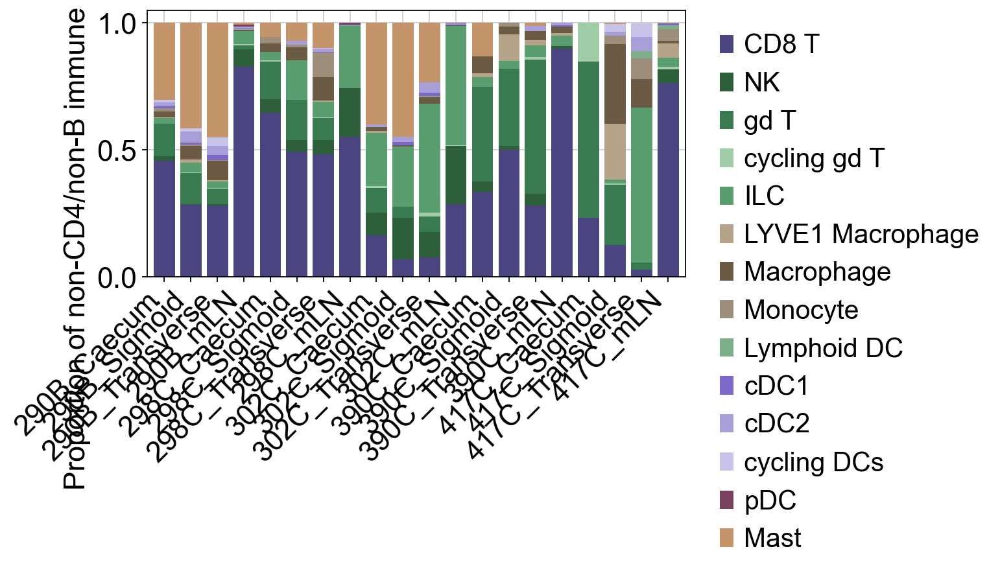

cell_type,CD8 T,NK,gd T,cycling gd T,ILC,LYVE1 Macrophage,Macrophage,Monocyte,Lymphoid DC,cDC1,cDC2,cycling DCs,pDC,Mast
sample_id,,,,,,,,,,,,,,
290B_Caecum,0.456368,0.017689,0.128538,0.000000,0.021226,0.002358,0.023585,0.014151,0.000000,0.005896,0.015330,0.011792,0.000000,0.303066
290B_Sigmoid,0.283410,0.002304,0.122120,0.002304,0.039171,0.011521,0.052995,0.006912,0.000000,0.006912,0.043779,0.013825,0.000000,0.414747
290B_Transverse,0.279070,0.006202,0.062016,0.001550,0.026357,0.004651,0.075969,0.003101,0.000000,0.020155,0.037209,0.032558,0.000000,0.451163
290B_mLN,0.827715,0.068664,0.013733,0.004994,0.051186,0.000000,0.004994,0.000000,0.002497,0.002497,0.007491,0.001248,0.008739,0.006242
298C_Caecum,0.644444,0.055556,0.148148,0.003704,0.033333,0.000000,0.033333,0.025926,0.000000,0.000000,0.000000,0.000000,0.000000,0.055556
298C_Sigmoid,0.492308,0.046154,0.158974,0.000000,0.153846,0.000000,0.051282,0.010256,0.000000,0.000000,0.015385,0.000000,0.000000,0.071795
298C_Transverse,0.482906,0.055556,0.087607,0.002137,0.059829,0.006410,0.091880,0.096154,0.000000,0.002137,0.012821,0.002137,0.000000,0.100427
298C_mLN,0.551118,0.190096,0.001597,0.000000,0.244409,0.000000,0.001597,0.000000,0.001597,0.001597,0.000000,0.000000,0.007987,0.000000
302C_Caecum,0.161538,0.089744,0.097436,0.007692,0.210256,0.007692,0.015385,0.000000,0.000000,0.000000,0.010256,0.000000,0.000000,0.400000


In [15]:
plot_fraction_bar(
    adata,
    keep_types=other_types,
    group_col=["donor", "region"],
    type_order=other_types,
    color_dict=celltype_colors,
    figsize=(10, 5),
    ylabel="Proportion of non-CD4/non-B immune cells (by Donor)"
)

/var/folders/_p/wlrwlb8j6zz_vb4ls4j_0fc00000gn/T/ipykernel_96625/2433639633.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(group_cols + [subtype_col])
/var/folders/_p/wlrwlb8j6zz_vb4ls4j_0fc00000gn/T/ipykernel_96625/2433639633.py:61: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ct["fraction"] = ct.groupby(group_cols)["n_cells"].transform(lambda x: x / x.sum())
/var/folders/_p/wlrwlb8j6zz_vb4ls4j_0fc00000gn/T/ipykernel_96625/2433639633.py:63: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False 

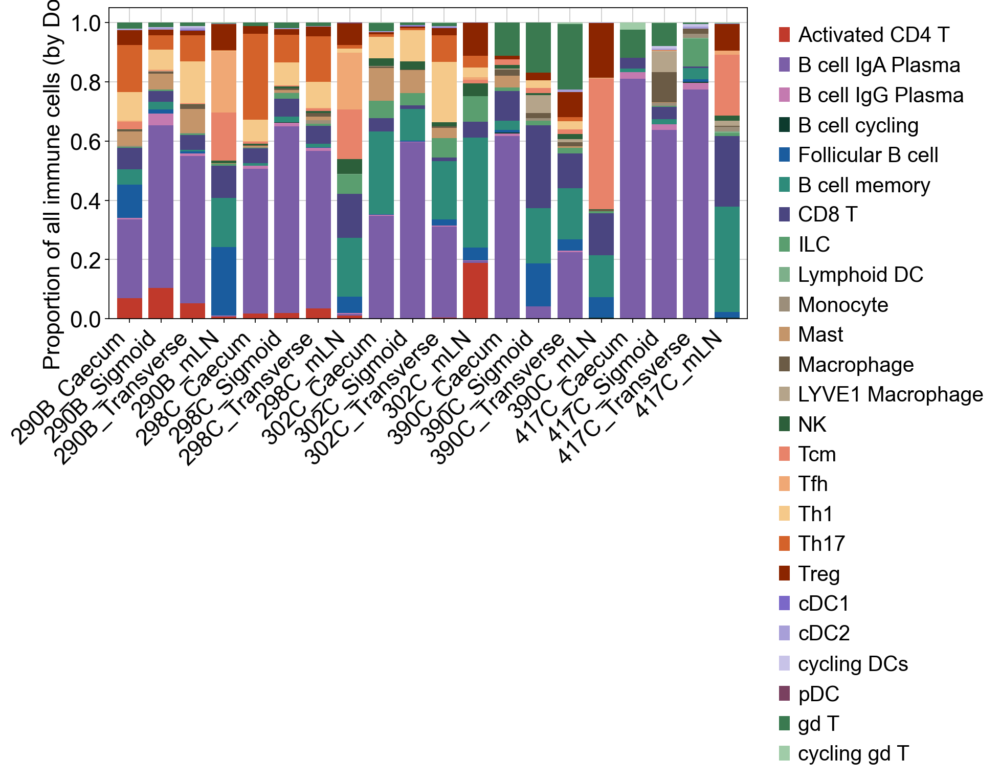

In [16]:
all_cells_proportion = plot_fraction_bar(
    adata,
    keep_types=cd4_types+b_types+other_types,
    group_col=["donor", "region"],
    #type_order=other_types,
    color_dict=celltype_colors,
    figsize=(10, 5),
    ylabel="Proportion of all immune cells (by Donor)"
)

## Load bacterial info

In [17]:
def clr_transform(df, pseudocount=1e-6):
    """Centred log-ratio transform for compositional microbiome data."""
    arr = df.to_numpy(dtype=float)
    row_sums = arr.sum(axis=1, keepdims=True)
    arr = arr / row_sums
    arr = np.log(arr + pseudocount)
    arr = arr - arr.mean(axis=1, keepdims=True)
    return pd.DataFrame(arr, index=df.index, columns=df.columns)

def clean_taxa_name(name):
    """Normalise 16S taxa labels to Phylum_Family_Genus format."""
    parts = name.split("_")
    n = len(parts)
    if n == 3:
        return name
    phylum = parts[0]

    # 7-part: Acidobacteria_Acidobacteria_Gp2_family_incertae_sedis_Gp2
    if n == 7 and phylum == "Acidobacteria":
        return "Acidobacteria_Gp2_incertae_sedis"
    # 6-part: Bacteria_unclassified_Bacteria_unclassified_Bacteria_unclassified
    if n == 6 and phylum == "Bacteria" and parts.count("unclassified") >= 3:
        return "Bacteria_unclassified_unclassified"
    # 8-part: A_B_incertae_sedis_B_incertae_sedis_unclassified
    if n == 8 and parts[2] == "incertae" and parts[3] == "sedis":
        return f"{phylum}_{parts[1]}_incertae_sedis"
    # 6-part: A_B_Incertae_Sedis_XI_Genus
    if n == 6 and parts[2].lower() == "incertae" and parts[3].lower() == "sedis":
        return f"{phylum}_{parts[1]}_{parts[5]}"
    # 6-part: A_B_1_Genus_sensu_stricto
    if n == 6 and parts[2] == "1" and parts[4] == "sensu" and parts[5] == "stricto":
        return f"{phylum}_{parts[1]}_{parts[3]}"
    # 5-part: A_A_unclassified_A_unclassified (phylum-level unclassified)
    if n == 5 and parts[1] == phylum and parts[2] == "unclassified":
        return f"{phylum}_unclassified_unclassified"
    # 5-part: A_B_unclassified_B_unclassified (order/class-level)
    if n == 5 and parts[2] == "unclassified" and parts[3] == parts[1] and parts[4] == "unclassified":
        return f"{phylum}_{parts[1]}_unclassified"
    # 5-part: A_B_B_incertae_sedis or A_B_Blike_incertae_sedis
    if n == 5 and parts[3] == "incertae" and parts[4] == "sedis":
        return f"{phylum}_{parts[1]}_incertae_sedis"
    # 5-part: A_B_incertae_sedis_Genus
    if n == 5 and parts[2] == "incertae" and parts[3] == "sedis":
        return f"{phylum}_{parts[1]}_{parts[4]}"
    # 4-part: A_B_B_suffix (family repeated as genus prefix)
    if n == 4 and parts[2] == parts[1]:
        return f"{phylum}_{parts[1]}_{parts[3]}"
    # 4-part: A_B_1_Genus (numbered family variant)
    if n == 4 and parts[2] == "1":
        return f"{phylum}_{parts[1]}_{parts[3]}"
    # 4-part: A_B_Clostridium_Roman -- keep to distinguish e.g. XlVa vs XlVb
    if n == 4 and parts[2] == "Clostridium":
        return name
    # 4-part generic: drop 4th token (e.g. Escherichia_Shigella -> Escherichia)
    if n == 4:
        return f"{phylum}_{parts[1]}_{parts[2]}"
    # Fallback
    return f"{phylum}_{parts[1]}_{parts[-1]}"

_bact_raw = pd.read_csv(
    "data/16s_microbiome_composition.csv",
    index_col=0,
).transpose()
# filter: drop all-zero genera (mean==0) and require >=25% prevalence (>=9/36 samples)
_rel = _bact_raw.div(_bact_raw.sum(axis=1), axis=0)
_keep = (_bact_raw > 0).sum(axis=0) >= 5
_keep &= _rel.mean(axis=0) > 0
print(f"Bacteria filter: {_bact_raw.shape[1]} → {_keep.sum()} genera (prev>=9/36, mean>0)")
bacterial_proportion = clr_transform(_bact_raw.loc[:, _keep])
bacterial_proportion.columns = [clean_taxa_name(c) for c in bacterial_proportion.columns]

common_samples = sorted(
    set(all_cells_proportion.index) & set(bacterial_proportion.index)
)
print(f"Common samples: {len(common_samples)}")

Bacteria filter: 133 → 66 genera (prev>=9/36, mean>0)
Common samples: 12


## Look into IgA genes 

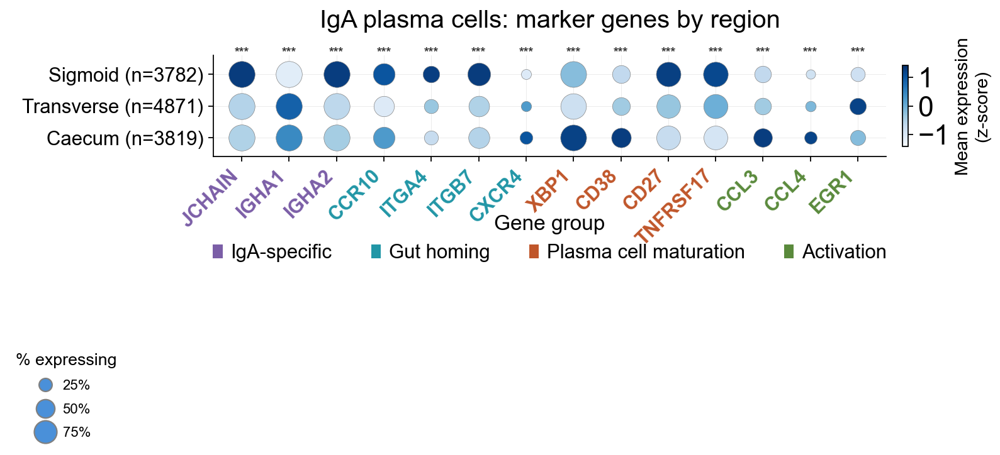

In [28]:
DOT_SCALE = 350
LEGEND_PCTS = [25, 50, 75]

gene_groups = {
    "IgA-specific":           ["JCHAIN", "IGHA1", "IGHA2"],
    "Gut homing":             ["CCR10", "ITGA4", "ITGB7", "CXCR4"],
    "Plasma cell maturation": ["XBP1", "CD38", "CD27", "TNFRSF17"],
    "Activation":             ["CCL3", "CCL4", "EGR1"],
}
group_colors = {
    "IgA-specific":           "#7B5EA7",
    "Gut homing":             "#2196A6",
    "Plasma cell maturation": "#C0562A",
    "Activation":             "#5A8A3C",
}

all_genes_ordered = []
for grp in gene_groups:
    all_genes_ordered.extend(gene_groups[grp])

iga_mask = (
    (adata.obs["cell_type"] == "B cell IgA Plasma")
    & (adata.obs["region"].isin(["Caecum", "Transverse", "Sigmoid"]))
)
iga_adata = adata[iga_mask].copy()

avail_genes = [g for g in all_genes_ordered if g in iga_adata.var_names]
missing = [g for g in all_genes_ordered if g not in iga_adata.var_names]
if missing:
    print(f"Missing: {missing}")

regions = ["Caecum", "Transverse", "Sigmoid"]

region_counts = iga_adata.obs["region"].value_counts()
region_labels = [f"{r} (n={region_counts.get(r, 0)})" for r in regions]

dot_data = {}
for region in regions:
    r_cells = iga_adata[iga_adata.obs["region"] == region]
    expr = r_cells[:, avail_genes].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray()
    dot_data[region] = {
        "mean_expr": expr.mean(axis=0),
        "pct_expr":  (expr > 0).mean(axis=0) * 100,
    }

mean_df = pd.DataFrame({r: dot_data[r]["mean_expr"] for r in regions}, index=avail_genes)
pct_df  = pd.DataFrame({r: dot_data[r]["pct_expr"]  for r in regions}, index=avail_genes)

_vals     = mean_df.values.astype(float)
_stds     = _vals.std(axis=1, keepdims=True)
_centered = np.where(_stds > 0, (_vals - _vals.mean(axis=1, keepdims=True)) / _stds, 0.0)
mean_centered = pd.DataFrame(_centered, index=mean_df.index, columns=mean_df.columns)

from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests
from itertools import combinations

_rows = []
for _gene in avail_genes:
    _expr_all = iga_adata[:, _gene].X
    if hasattr(_expr_all, "toarray"): _expr_all = _expr_all.toarray().ravel()
    else: _expr_all = _expr_all.ravel()
    for _r1, _r2 in combinations(regions, 2):
        _x1 = _expr_all[iga_adata.obs["region"] == _r1]
        _x2 = _expr_all[iga_adata.obs["region"] == _r2]
        if len(_x1) >= 2 and len(_x2) >= 2:
            _, _pval = mannwhitneyu(_x1, _x2, alternative="two-sided")
            _rows.append({"gene": _gene, "pair": _r1 + " vs " + _r2, "pval": _pval})
_sdf = pd.DataFrame(_rows)
_, _padj, _, _ = multipletests(_sdf["pval"], method="fdr_bh")
_sdf["adj_pval"] = _padj
_gene_sig = _sdf.groupby("gene")["adj_pval"].min()

fig, ax = plt.subplots(figsize=(12, 4))

vmax = max(float(np.abs(_centered).max()), 0.5)
n_genes = len(avail_genes)

for gi, gene in enumerate(avail_genes):
    for ri, region in enumerate(regions):
        pct  = pct_df.loc[gene, region]
        cval = mean_centered.loc[gene, region]
        size = (pct / 100) * DOT_SCALE
        color = plt.cm.Blues((cval + vmax) / (2 * vmax) * 0.85 + 0.1)
        ax.scatter(
            gi, ri, s=size, color=color,
            edgecolors="grey", linewidths=0.3, zorder=3
        )

# One significance marker per gene above the column
for gi, gene in enumerate(avail_genes):
    p = _gene_sig.get(gene, 1.0)
    star = "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else ""
    if star:
        ax.text(gi, len(regions) - 0.5, star, ha="center", va="bottom",
                fontsize=9, color="#333333", fontweight="bold", clip_on=False)
ax.set_yticks(range(len(regions)))
ax.set_yticklabels(region_labels, fontsize=14)
ax.set_xticks(range(n_genes))
ax.set_xticklabels(avail_genes, rotation=45, ha="right", fontsize=14)
ax.set_xlim(-0.6, n_genes - 0.4)
ax.set_ylim(-0.6, len(regions) - 0.4)
ax.grid(True, linewidth=0.4, alpha=0.4)
ax.set_axisbelow(True)
ax.spines[["top", "right"]].set_visible(False)

# Color x-tick labels by group
gene_to_group = {g: grp for grp, genes in gene_groups.items() for g in genes}
for tick_label, gene in zip(ax.get_xticklabels(), avail_genes):
    grp = gene_to_group.get(gene, "Activation")
    tick_label.set_color(group_colors[grp])
    tick_label.set_fontweight("bold")

# Colorbar
import matplotlib.colors as mcolors
sm = plt.cm.ScalarMappable(cmap="Blues", norm=mcolors.Normalize(vmin=-vmax, vmax=vmax))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, shrink=0.8, pad=0.02, aspect=15)
cbar.set_label("Mean expression\n(z-score)", fontsize=13)
cbar.set_ticks([-1, 0, 1])

# Dot size legend
from matplotlib.lines import Line2D
size_handles = [
    Line2D([0], [0], marker="o", color="w", markerfacecolor="#4A90D9",
           markeredgecolor="grey", markersize=((v / 100 * DOT_SCALE) ** 0.5),
           label=f"{v}%")
    for v in LEGEND_PCTS
]
# Group color legend — kept as ax.legend_ so it renders normally
from matplotlib.patches import Patch
group_handles = [Patch(facecolor=group_colors[g], label=g) for g in gene_groups]
ax.legend(handles=group_handles, title="Gene group",
          loc="upper center", bbox_to_anchor=(0.5, -0.4),
          ncol=4, frameon=False, fontsize=14, title_fontsize=15)

# Size legend — attached to the figure (not axes) so it won't be clipped
from matplotlib.legend import Legend
size_labels = [f"{v}%" for v in LEGEND_PCTS]
size_leg = Legend(fig, size_handles, size_labels,
                  title="% expressing",
                  loc="upper left",
                  bbox_to_anchor=(0.01, 0.1),
                  bbox_transform=fig.transFigure,
                  frameon=False, fontsize=10, title_fontsize=12,
                  handletextpad=1, labelspacing=0.8)
fig.add_artist(size_leg)

ax.set_title("IgA plasma cells: marker genes by region", fontsize=18, pad=20)
plt.tight_layout(rect=[0, 0, 0.88, 1])
plt.show()


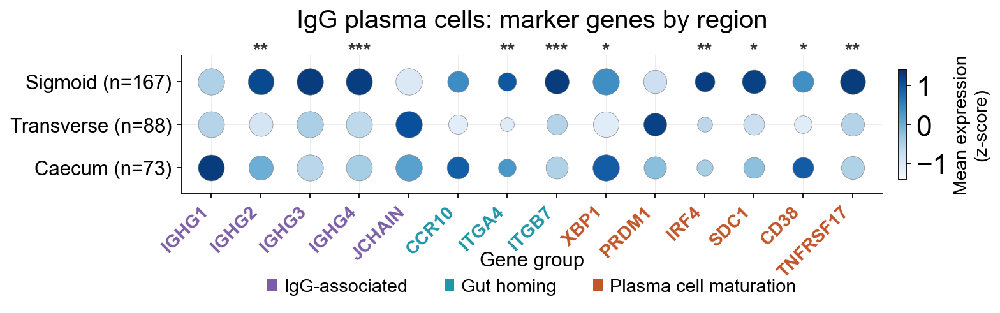

In [29]:
DOT_SCALE = 350
LEGEND_PCTS = [25, 50, 75]

gene_groups = {
    "IgG-associated":         ["IGHG1", "IGHG2", "IGHG3", "IGHG4", "JCHAIN"],
    "Gut homing":             ["CCR10", "ITGA4", "ITGB7"],
    "Plasma cell maturation": ["XBP1", "PRDM1", "IRF4", "SDC1", "CD38", "TNFRSF17"],
}
group_colors = {
    "IgG-associated":         "#7B5EA7",
    "Gut homing":             "#2196A6",
    "Plasma cell maturation": "#C0562A",
}

all_genes_ordered = []
for grp in gene_groups:
    all_genes_ordered.extend(gene_groups[grp])

igg_mask = (
    (adata.obs["cell_type"] == "B cell IgG Plasma")
    & (adata.obs["region"].isin(["Caecum", "Transverse", "Sigmoid"]))
)
igg_adata = adata[igg_mask].copy()

avail_genes = [g for g in all_genes_ordered if g in igg_adata.var_names]
missing = [g for g in all_genes_ordered if g not in igg_adata.var_names]
if missing:
    print(f"Missing: {missing}")

regions = ["Caecum", "Transverse", "Sigmoid"]

region_counts = igg_adata.obs["region"].value_counts()
region_labels = [f"{r} (n={region_counts.get(r, 0)})" for r in regions]

dot_data = {}
for region in regions:
    r_cells = igg_adata[igg_adata.obs["region"] == region]
    expr = r_cells[:, avail_genes].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray()
    dot_data[region] = {
        "mean_expr": expr.mean(axis=0),
        "pct_expr":  (expr > 0).mean(axis=0) * 100,
    }

mean_df = pd.DataFrame({r: dot_data[r]["mean_expr"] for r in regions}, index=avail_genes)
pct_df  = pd.DataFrame({r: dot_data[r]["pct_expr"]  for r in regions}, index=avail_genes)

_vals     = mean_df.values.astype(float)
_stds     = _vals.std(axis=1, keepdims=True)
_centered = np.where(_stds > 0, (_vals - _vals.mean(axis=1, keepdims=True)) / _stds, 0.0)
mean_centered = pd.DataFrame(_centered, index=mean_df.index, columns=mean_df.columns)

from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests
from itertools import combinations

_rows = []
for _gene in avail_genes:
    _expr_all = igg_adata[:, _gene].X
    if hasattr(_expr_all, "toarray"): _expr_all = _expr_all.toarray().ravel()
    else: _expr_all = _expr_all.ravel()
    for _r1, _r2 in combinations(regions, 2):
        _x1 = _expr_all[igg_adata.obs["region"] == _r1]
        _x2 = _expr_all[igg_adata.obs["region"] == _r2]
        if len(_x1) >= 2 and len(_x2) >= 2:
            _, _pval = mannwhitneyu(_x1, _x2, alternative="two-sided")
            _rows.append({"gene": _gene, "pair": _r1 + " vs " + _r2, "pval": _pval})
_sdf = pd.DataFrame(_rows)
_, _padj, _, _ = multipletests(_sdf["pval"], method="fdr_bh")
_sdf["adj_pval"] = _padj
_gene_sig = _sdf.groupby("gene")["adj_pval"].min()

fig, ax = plt.subplots(figsize=(12, 4))

vmax = max(float(np.abs(_centered).max()), 0.5)
n_genes = len(avail_genes)

for gi, gene in enumerate(avail_genes):
    for ri, region in enumerate(regions):
        pct  = pct_df.loc[gene, region]
        cval = mean_centered.loc[gene, region]
        size = (pct / 100) * DOT_SCALE
        color = plt.cm.Blues((cval + vmax) / (2 * vmax) * 0.85 + 0.1)
        ax.scatter(
            gi, ri, s=size, color=color,
            edgecolors="grey", linewidths=0.3, zorder=3
        )

# One significance marker per gene above the column
for gi, gene in enumerate(avail_genes):
    p = _gene_sig.get(gene, 1.0)
    star = "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else ""
    if star:
        ax.text(gi, len(regions) - 0.5, star, ha="center", va="bottom",
                fontsize=14, color="#333333", fontweight="bold", clip_on=False)

ax.set_yticks(range(len(regions)))
ax.set_yticklabels(region_labels, fontsize=14)
ax.set_xticks(range(n_genes))
ax.set_xticklabels(avail_genes, rotation=45, ha="right", fontsize=13)
ax.set_xlim(-0.6, n_genes - 0.4)
ax.set_ylim(-0.6, len(regions) - 0.4)
ax.grid(True, linewidth=0.4, alpha=0.4)
ax.set_axisbelow(True)
ax.spines[["top", "right"]].set_visible(False)

# Color x-tick labels by group
gene_to_group = {g: grp for grp, genes in gene_groups.items() for g in genes}
for tick_label, gene in zip(ax.get_xticklabels(), avail_genes):
    grp = gene_to_group.get(gene, "Plasma cell maturation")
    tick_label.set_color(group_colors[grp])
    tick_label.set_fontweight("bold")

# Colorbar
import matplotlib.colors as mcolors
sm = plt.cm.ScalarMappable(cmap="Blues", norm=mcolors.Normalize(vmin=-vmax, vmax=vmax))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, shrink=0.8, pad=0.02, aspect=15)
cbar.set_label("Mean expression\n(z-score)", fontsize=13)
cbar.set_ticks([-1, 0, 1])

# Dot size legend
from matplotlib.lines import Line2D
size_handles = [
    Line2D([0], [0], marker="o", color="w", markerfacecolor="#4A90D9",
           markeredgecolor="grey", markersize=((v / 100 * DOT_SCALE) ** 0.5),
           label=f"{v}%")
    for v in LEGEND_PCTS
]

# Group color legend
from matplotlib.patches import Patch
group_handles = [Patch(facecolor=group_colors[g], label=g) for g in gene_groups]
ax.legend(handles=group_handles, title="Gene group",
          loc="upper center", bbox_to_anchor=(0.5, -0.3),
          ncol=3, frameon=False, fontsize=13, title_fontsize=14)

ax.set_title("IgG plasma cells: marker genes by region", fontsize=18, pad=20)
plt.tight_layout(rect=[0, 0, 0.88, 1])
plt.show()


## Look into Th1/Th17 differentiation genes

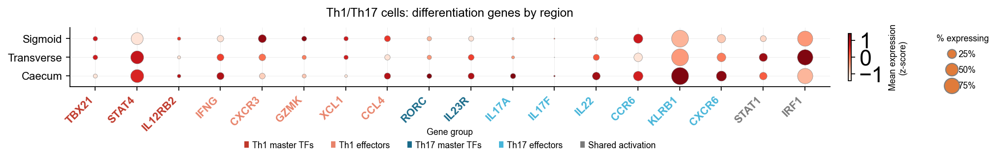

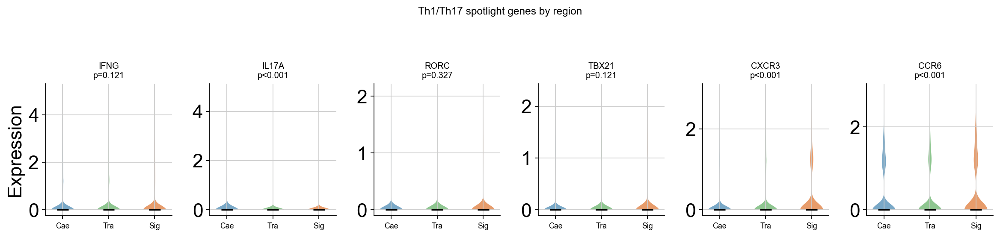

In [493]:
th_gene_groups = {
    "Th1 master TFs":    ["TBX21", "STAT4", "IL12RB2"],
    "Th1 effectors":     ["IFNG", "CXCR3", "GZMK", "XCL1", "CCL4"],
    "Th17 master TFs":   ["RORC", "IL23R"],
    "Th17 effectors":    ["IL17A", "IL17F", "IL22", "CCR6", "KLRB1", "CXCR6"],
    "Shared activation": ["STAT1", "IRF1"],
}
th_group_colors = {
    "Th1 master TFs":    "#C0392B",
    "Th1 effectors":     "#E8836A",
    "Th17 master TFs":   "#1A6B8A",
    "Th17 effectors":    "#46B5D9",
    "Shared activation": "#7A7A7A",
}

th_genes_ordered = [g for grp in th_gene_groups for g in th_gene_groups[grp]]

th_mask = (
    adata.obs["cell_type"].isin(["Th1", "Th17"]) &
    adata.obs["region"].isin(["Caecum", "Transverse", "Sigmoid"])
)
th_adata = adata[th_mask].copy()

avail = [g for g in th_genes_ordered if g in th_adata.var_names]
missing = [g for g in th_genes_ordered if g not in th_adata.var_names]
if missing:
    print(f"Missing genes: {missing}")

regions = ["Caecum", "Transverse", "Sigmoid"]

dot_data = {}
for region in regions:
    r_cells = th_adata[th_adata.obs["region"] == region]
    expr = r_cells[:, avail].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray()
    dot_data[region] = {
        "mean_expr": expr.mean(axis=0),
        "pct_expr":  (expr > 0).mean(axis=0) * 100,
    }

mean_df = pd.DataFrame({r: dot_data[r]["mean_expr"] for r in regions}, index=avail)
pct_df  = pd.DataFrame({r: dot_data[r]["pct_expr"]  for r in regions}, index=avail)

_vals     = mean_df.values.astype(float)
_stds     = _vals.std(axis=1, keepdims=True)
_centered = np.where(_stds > 0, (_vals - _vals.mean(axis=1, keepdims=True)) / _stds, 0.0)
mean_centered = pd.DataFrame(_centered, index=mean_df.index, columns=mean_df.columns)

fig, ax = plt.subplots(figsize=(13, 3.5))
vmax = max(float(np.abs(_centered).max()), 0.5)
n_genes = len(avail)

for gi, gene in enumerate(avail):
    for ri, region in enumerate(regions):
        pct  = pct_df.loc[gene, region]
        cval = mean_centered.loc[gene, region]
        size  = (pct / 100) * 260
        color = plt.cm.Reds((cval + vmax) / (2 * vmax) * 0.85 + 0.1)
        ax.scatter(gi, ri, s=size, color=color,
                   edgecolors="grey", linewidths=0.3, zorder=3)

ax.set_yticks(range(len(regions)))
ax.set_yticklabels(regions, fontsize=10)
ax.set_xticks(range(n_genes))
ax.set_xticklabels(avail, rotation=45, ha="right", fontsize=10)
ax.set_xlim(-0.6, n_genes - 0.4)
ax.set_ylim(-0.6, len(regions) - 0.4)
ax.grid(True, linewidth=0.4, alpha=0.4)
ax.set_axisbelow(True)
ax.spines[["top", "right"]].set_visible(False)

gene_to_group = {g: grp for grp, genes in th_gene_groups.items() for g in genes}
for tick_label, gene in zip(ax.get_xticklabels(), avail):
    tick_label.set_color(th_group_colors[gene_to_group.get(gene, "Shared activation")])
    tick_label.set_fontweight("bold")

import matplotlib.colors as mcolors
sm = plt.cm.ScalarMappable(cmap="Reds", norm=mcolors.Normalize(vmin=-vmax, vmax=vmax))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, shrink=0.8, pad=0.02, aspect=15)
cbar.set_label("Mean expression\n(z-score)", fontsize=8)
cbar.set_ticks([-1, 0, 1])

from matplotlib.lines import Line2D
size_handles = [
    Line2D([0],[0], marker="o", color="w", markerfacecolor="#E07B3A",
           markeredgecolor="grey", markersize=((v/100*260)**0.5), label=f"{v}%")
    for v in [25, 50, 75]
]
size_leg = ax.legend(handles=size_handles, title="% expressing",
                     loc="upper left", bbox_to_anchor=(1.13, 1.02),
                     frameon=False, fontsize=8, title_fontsize=8,
                     handletextpad=0.5, labelspacing=0.8)
ax.add_artist(size_leg)

from matplotlib.patches import Patch
group_handles = [Patch(facecolor=th_group_colors[g], label=g) for g in th_gene_groups]
ax.legend(handles=group_handles, title="Gene group",
          loc="upper center", bbox_to_anchor=(0.5, -0.55),
          ncol=5, frameon=False, fontsize=8, title_fontsize=8)

ax.set_title("Th1/Th17 cells: differentiation genes by region", fontsize=11, pad=10)
plt.tight_layout()
plt.show()

from scipy.stats import kruskal as _kruskal

spotlight_genes = ["IFNG", "IL17A", "RORC", "TBX21", "CXCR3", "CCR6"]
spotlight_genes = [g for g in spotlight_genes if g in th_adata.var_names]

fig, axes = plt.subplots(1, len(spotlight_genes),
                         figsize=(2.5 * len(spotlight_genes), 3.5),
                         sharey=False)

region_colors = {"Caecum": "#4C8BB5", "Transverse": "#68B36B", "Sigmoid": "#E07B3A"}

for ax, gene in zip(axes, spotlight_genes):
    expr_by_region = {}
    for region in regions:
        cells = th_adata[th_adata.obs["region"] == region]
        e = cells[:, gene].X
        if hasattr(e, "toarray"):
            e = e.toarray()
        expr_by_region[region] = e.flatten()

    parts = ax.violinplot(
        [expr_by_region[r] for r in regions],
        positions=range(len(regions)),
        showmedians=True, showextrema=False,
    )
    for pc, region in zip(parts["bodies"], regions):
        pc.set_facecolor(region_colors[region])
        pc.set_alpha(0.75)
    parts["cmedians"].set_color("black")
    parts["cmedians"].set_linewidth(1.5)

    # Kruskal-Wallis p-value
    try:
        groups = [expr_by_region[r] for r in regions if len(expr_by_region[r]) >= 2]
        if len(groups) >= 2:
            _, pval = _kruskal(*groups)
            ptext = f"p={pval:.3f}" if pval >= 0.001 else "p<0.001"
        else:
            ptext = "n/a"
    except Exception:
        ptext = "n/a"

    ax.set_title(f"{gene}\n{ptext}", fontsize=9)
    ax.set_xticks(range(len(regions)))
    ax.set_xticklabels([r[:3] for r in regions], fontsize=8)
    ax.set_ylabel("Expression" if ax == axes[0] else "")
    ax.spines[["top", "right"]].set_visible(False)

fig.suptitle("Th1/Th17 spotlight genes by region", fontsize=11, y=1.02)
plt.tight_layout()
plt.show()

## pathway score

In [494]:
def _norm_donor(x):
    return str(x).strip().upper()

def _norm_region(x):
    mapping = {
        "Cecum": "Caecum",  "cecum": "Caecum",  "Caecum": "Caecum",
        "Transverse": "Transverse", "transverse": "Transverse",
        "Sigmoid": "Sigmoid",       "sigmoid": "Sigmoid",
        "mLN": "mLN",              "MLN": "mLN",
    }
    return mapping.get(str(x).strip(), str(x).strip())

In [495]:
def pathway_feature_table(
    adata,
    cell_types,
    gene_sets,
    cell_type_col="cell_type",
    donor_col="donor",
    region_col="region",
):
    """
    Pseudobulk mean pathway scores for one or more cell types.
    Columns are named "PATHWAY__CellType" so each cell type keeps its
    own feature block (same Option-B layout as build_gene_expr_host_df).
    """
    if isinstance(cell_types, str):
        cell_types = [cell_types]

    blocks = []
    for ct in cell_types:
        a = adata[adata.obs[cell_type_col] == ct].copy()
        if a.n_obs == 0:
            continue

        a.obs[donor_col] = a.obs[donor_col].map(_norm_donor)
        a.obs[region_col] = a.obs[region_col].map(_norm_region)
        a.obs["sample_id"] = (
            a.obs[donor_col].astype(str) + "_" + a.obs[region_col].astype(str)
        )

        score_names = []
        for score_name, genes in gene_sets.items():
            genes_use = [g for g in genes if g in a.var_names]
            if len(genes_use) >= 2:
                sc.tl.score_genes(a, gene_list=genes_use, score_name=score_name)
                score_names.append(score_name)

        block = a.obs.groupby("sample_id")[score_names].mean()
        block.columns = [f"{s}__{ct}" for s in block.columns]
        blocks.append(block)

    feat_df = pd.concat(blocks, axis=1).fillna(0)
    return feat_df



def pathway_feature_table_mapped(adata, celltype_geneset_map, gene_sets, **kwargs):
    """
    Like pathway_feature_table but each cell type scores ONLY the gene sets
    listed in celltype_geneset_map[celltype]. Avoids nonsensical pairings
    like Th1_program__Th17 or Tfh_program__Treg.
    """
    blocks = []
    for ct, geneset_names in celltype_geneset_map.items():
        sub_sets = {k: gene_sets[k] for k in geneset_names if k in gene_sets}
        if not sub_sets:
            continue
        block = pathway_feature_table(adata, cell_types=[ct],
                                       gene_sets=sub_sets, **kwargs)
        blocks.append(block)
    return pd.concat(blocks, axis=1).fillna(0)


In [496]:
%%capture cap

pathway_df = pathway_feature_table(
    adata,
    cell_types=cd4_types + b_types + other_types,
    gene_sets=gene_sets,
)

# Cell-type-matched: each T cell type scores only its lineage program + universals
t_pathway_df = pathway_feature_table_mapped(
    adata,
    celltype_geneset_map=t_celltype_geneset_map,
    gene_sets=gene_sets,
)

# Cell-type-matched: each B cell type scores only its lineage program + universals
b_pathway_df = pathway_feature_table_mapped(
    adata,
    celltype_geneset_map=b_celltype_geneset_map,
    gene_sets=gene_sets,
)

cd4_pathway_df = pathway_feature_table(
    adata,
    cell_types=cd4_types,
    gene_sets=gene_sets,
)

cytolymph_pathway_df = pathway_feature_table(
    adata,
    cell_types=cytolymph_types,
    gene_sets=cytolymph_gene_sets,
)

myeloid_pathway_df = pathway_feature_table(
    adata,
    cell_types=myeloid_types,
    gene_sets=myeloid_gene_sets,
)


# Aim 2 - MOFA

In [514]:
from mofapy2.run.entry_point import entry_point

view_prop = all_cells_proportion.loc[
    all_cells_proportion.index.intersection(common_samples)
].copy()

view_path = pathway_df.loc[
    pathway_df.index.intersection(common_samples)
].copy()

view_bact = bacterial_proportion.loc[
    bacterial_proportion.index.intersection(common_samples)
].copy()

shared = sorted(set(view_prop.index) & set(view_path.index) & set(view_bact.index))
view_prop = view_prop.loc[shared]
view_path = view_path.loc[shared]
view_bact = view_bact.loc[shared]

print(f"Samples: {len(shared)}")
print(f"View 1 - proportions : {view_prop.shape}")
print(f"View 2 - pathway scores: {view_path.shape}")
print(f"View 3 - bacteria     : {view_bact.shape}")

Samples: 12
View 1 - proportions : (12, 25)
View 2 - pathway scores: (12, 600)
View 3 - bacteria     : (12, 66)


In [515]:
%%capture

ent = entry_point()

ent.set_data_options(
    scale_groups=False,
    scale_views=True,
)

ent.set_data_matrix(
    data=[
        [view_prop.values],   # view 1: [group_0]
        [view_path.values],   # view 2: [group_0]
        [view_bact.values],   # view 3: [group_0]
    ],
    views_names=["Proportions", "Pathway scores", "Bacterial 16S composition"],
    groups_names=["all"],
    samples_names=[shared],
    features_names=[
        list(view_prop.columns),
        list(view_path.columns),
        list(view_bact.columns),
    ],
)

ent.set_model_options(
    factors=8,
    spikeslab_weights=True,
    ard_factors=True,
    ard_weights=True,
)

ent.set_train_options(
    iter=2000,
    convergence_mode="slow",
    seed=42,
    verbose=False,
)

ent.build()
ent.run()

print("MOFA+ training complete.")

In [516]:
plt.rcParams.update({
    "font.size":        15,
    "axes.titlesize":   15,
    "axes.labelsize":   15,
    "xtick.labelsize":  15,
    "ytick.labelsize":  15,
    "legend.fontsize":  15,
    "legend.title_fontsize": 15,
})

In [520]:
def mofa_permutation_test(
    factor_df,
    factor_col,
    group_col,
    mode="within_donor",
    donor_col="donor",
    n_perm=1000,
    seed=0,
    title_prefix="MOFA",
):
    """
    Permutation test for MOFA factor score ~ group_col using Kruskal-Wallis H.

    mode="within_donor"  : shuffle group_col labels within each donor (controls for donor effect).
    mode="unrestricted"  : shuffle group_col labels freely across all samples.
    """
    from scipy.stats import kruskal as _kruskal

    rng = np.random.default_rng(seed)
    df = factor_df.copy()

    def _kw_stat(d, col, grp):
        groups = [g[col].values for _, g in d.groupby(grp)]
        groups = [g for g in groups if len(g) >= 2]
        if len(groups) < 2:
            return np.nan
        return _kruskal(*groups).statistic

    observed_h = _kw_stat(df, factor_col, group_col)

    labels = df[group_col].values.copy()
    donors = df[donor_col].values
    null_hs = []

    for _ in range(n_perm):
        perm_labels = labels.copy()
        if mode == "within_donor":
            for d in np.unique(donors):
                idx = np.where(donors == d)[0]
                perm_labels[idx] = rng.permutation(labels[idx])
        else:
            perm_labels = rng.permutation(labels)
        df_perm = df.copy()
        df_perm[group_col] = perm_labels
        null_hs.append(_kw_stat(df_perm, factor_col, group_col))

    null_hs = np.array(null_hs)
    pval = (np.sum(null_hs >= observed_h) + 1) / (n_perm + 1)

    label = "within-donor" if mode == "within_donor" else "unrestricted"
    fig, ax = plt.subplots(figsize=(5, 3.5))
    ax.hist(null_hs, bins=40, color="#4C8BB5", alpha=0.7,
            label=f"Null ({label} permuted)")
    ax.axvline(observed_h, color="#E07B3A", lw=2,
               label=f"Observed H={observed_h:.3f}\np={pval:.4f}")
    ax.set_xlabel("Kruskal-Wallis H")
    ax.set_ylabel("Count")
    ax.set_title(f"{title_prefix}: {factor_col} ~ {group_col} ({label})")
    ax.legend(frameon=False, fontsize=9)
    ax.spines[["top", "right"]].set_visible(False)
    plt.tight_layout()
    plt.show()

    print(f"Observed H : {observed_h:.4f}")
    print(f"p-value ({label}, {n_perm} perms): {pval:.4f}")
    return {"observed_h": observed_h, "null_hs": null_hs, "pval": pval, "mode": mode}


## B cell + T cell MOFA

In [535]:
# === B cell + T cell MOFA (5 views) ===
# View 1: B cell subtype proportions
# View 2: T cell proportions
# View 3: B cell pathway scores
# View 4: T cell pathway scores
# View 5: Bacterial 16S CLR

bt_views = {
    "B cell proportions": b_cell_proportion,
    "T cell proportions": t_cell_proportion,
    "B cell pathways":    b_pathway_df,
    "T cell pathways":    t_pathway_df,
    "Bacterial 16S":      bacterial_proportion,
}

shared_bt = sorted(set.intersection(*[set(df.index) for df in bt_views.values()]))
bt_views = {name: df.loc[shared_bt] for name, df in bt_views.items()}

print(f"Shared samples: {len(shared_bt)}")
for name, df in bt_views.items():
    print(f"  {name}: {df.shape}")


Shared samples: 12
  B cell proportions: (12, 5)
  T cell proportions: (12, 6)
  B cell pathways: (12, 32)
  T cell pathways: (12, 65)
  Bacterial 16S: (12, 66)


In [536]:
%%capture

ent_bt = entry_point()
ent_bt.set_data_options(scale_groups=False, scale_views=True)
ent_bt.set_data_matrix(
    data=[[df.values] for df in bt_views.values()],
    views_names=list(bt_views.keys()),
    groups_names=["group0"],
)
ent_bt.set_model_options(factors=8)
ent_bt.set_train_options(iter=2000, convergence_mode="fast", seed=42, verbose=False)
ent_bt.build()
ent_bt.run()


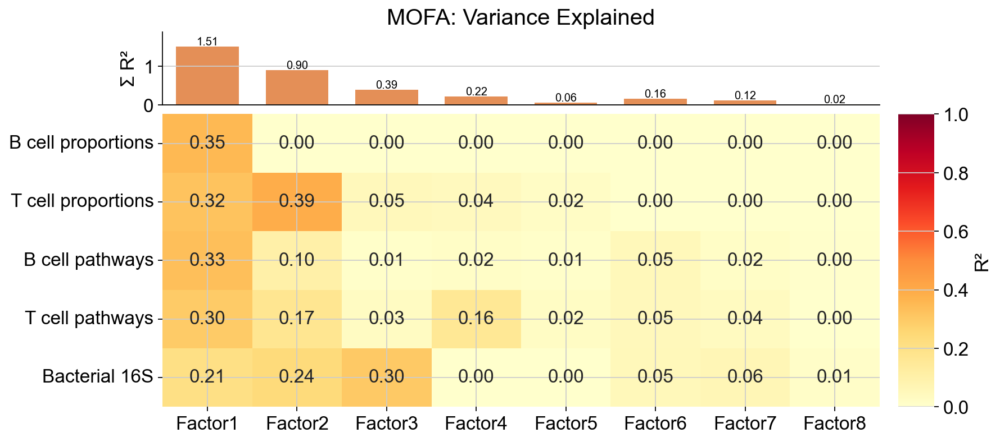

In [537]:
Z_bt = np.array(ent_bt.model.nodes["Z"].getExpectation())
n_factors_bt = Z_bt.shape[1]

factor_df_bt = pd.DataFrame(
    Z_bt, index=shared_bt,
    columns=[f"Factor{i+1}" for i in range(n_factors_bt)],
)
factor_df_bt["donor"]  = [s.split("_")[0] for s in shared_bt]
factor_df_bt["region"] = [s.split("_", 1)[1] for s in shared_bt]

view_names_bt = list(bt_views.keys())

r2_bt = np.array(ent_bt.model.calculate_variance_explained()).squeeze()
if r2_bt.ndim == 1:
    r2_bt = r2_bt.reshape(1, -1)
r2_bt_df = pd.DataFrame(
    r2_bt, index=view_names_bt,
    columns=[f"Factor{i+1}" for i in range(n_factors_bt)],
)
cum_per_factor = r2_bt_df.sum(axis=0)

# Use gridspec so top bar and heatmap share the SAME data column,
# with the colorbar in its own narrow column on the right.
fig = plt.figure(figsize=(11, 5.5))
gs  = fig.add_gridspec(
    2, 2,
    width_ratios=[20, 1], height_ratios=[1, 4],
    hspace=0.05, wspace=0.05,
)
ax_top  = fig.add_subplot(gs[0, 0])
ax_heat = fig.add_subplot(gs[1, 0])
ax_cbar = fig.add_subplot(gs[1, 1])
fig.add_subplot(gs[0, 1]).axis("off")   # empty corner

# Top: cumulative R² per factor
ax_top.bar(range(n_factors_bt), cum_per_factor.values,
           color="#E07B3A", alpha=0.85, width=0.7)
for x, v in enumerate(cum_per_factor.values):
    ax_top.text(x, v + 0.04, f"{v:.2f}", ha="center", fontsize=9)
ax_top.set_xticks([])
ax_top.set_xlim(-0.5, n_factors_bt - 0.5)
ax_top.set_ylim(0, max(1, cum_per_factor.max() * 1.25))
ax_top.set_ylabel("Σ R²")
ax_top.set_title("MOFA: Variance Explained", fontsize=18)
ax_top.spines[["top", "right"]].set_visible(False)

# Heatmap (colorbar drawn into ax_cbar so the heatmap axis stays full-width)
sns.heatmap(r2_bt_df, annot=True, fmt=".2f", cmap="YlOrRd",
            vmin=0, vmax=1, ax=ax_heat,
            cbar=True, cbar_ax=ax_cbar, cbar_kws={"label": "R²"})
ax_heat.set_xlabel("")
ax_heat.set_ylabel("")

plt.show()


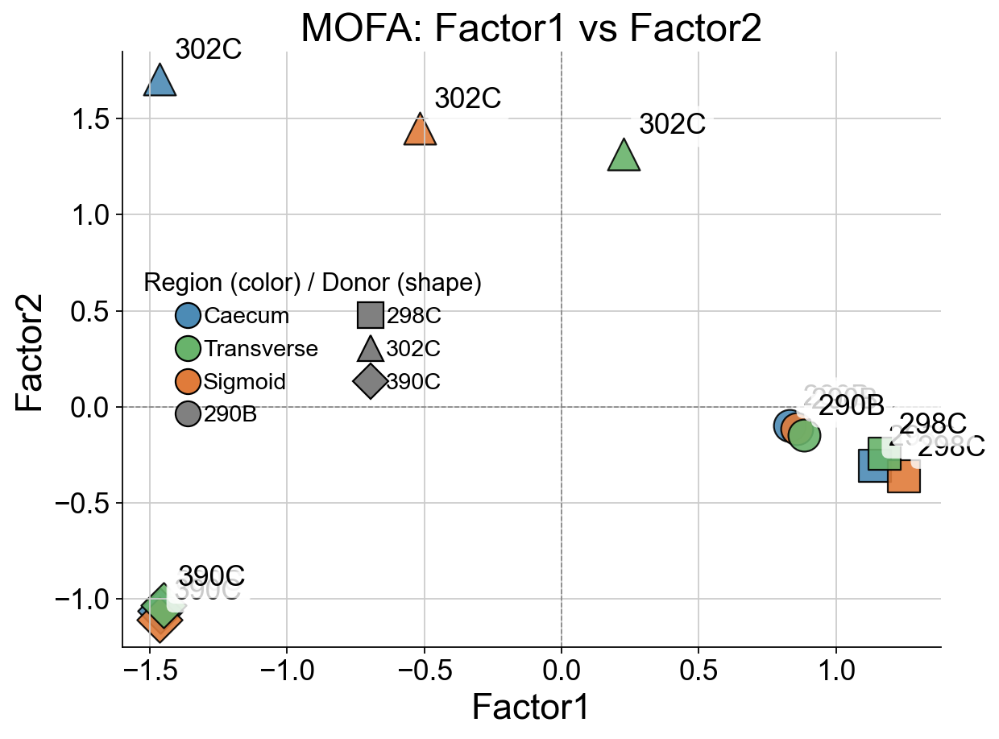

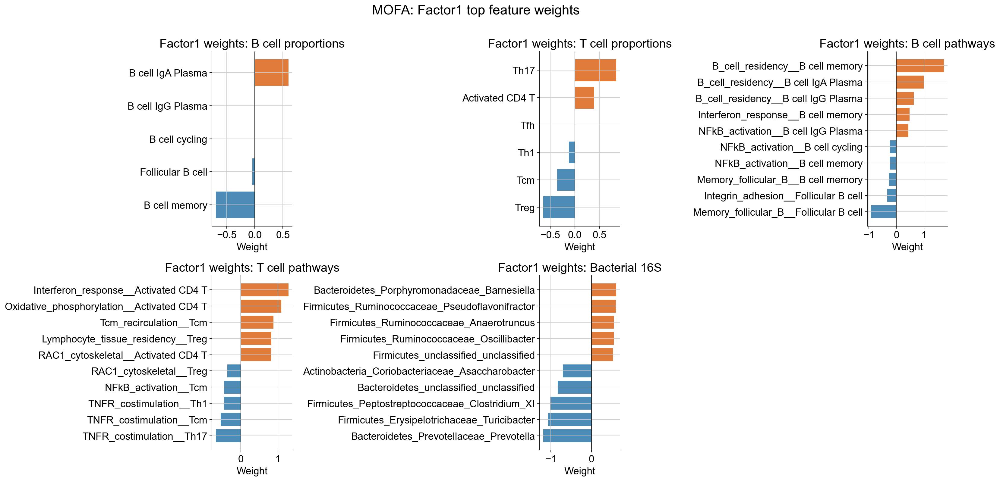

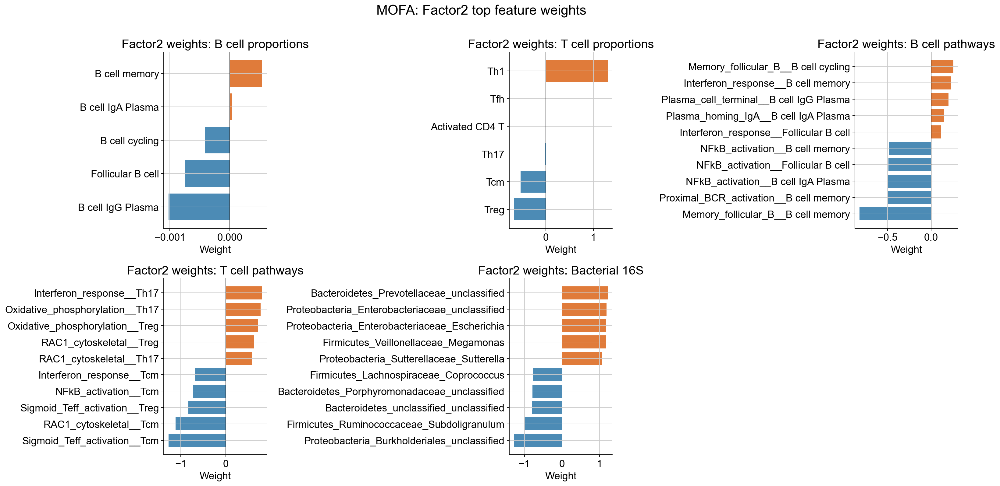

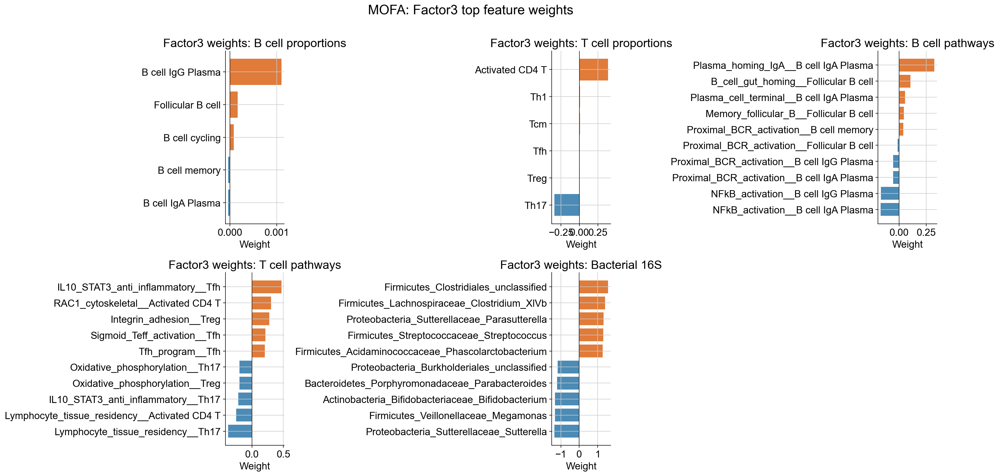

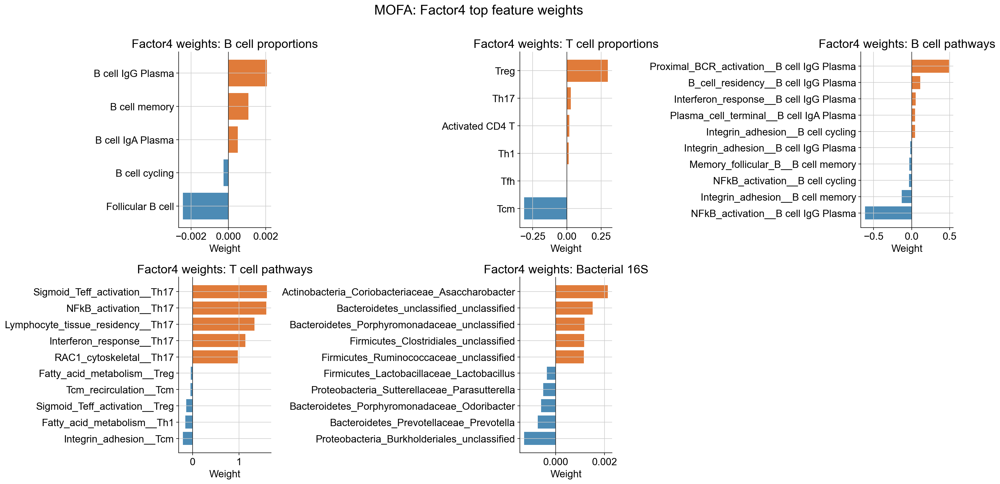

In [538]:
region_colors_bt = {"Caecum": "#4C8BB5", "Transverse": "#68B36B", "Sigmoid": "#E07B3A"}
donor_markers_bt = {}
_marker_pool = ["o", "s", "^", "D", "P", "X", "v", "<", ">"]
for i, d in enumerate(sorted(factor_df_bt["donor"].unique())):
    donor_markers_bt[d] = _marker_pool[i % len(_marker_pool)]

# --- MOFA Factor 1 vs Factor 2 ---
fig, ax = plt.subplots(figsize=(8, 6))
fx, fy = "Factor1", "Factor2"
for _, row in factor_df_bt.iterrows():
    ax.scatter(
        row[fx], row[fy],
        color=region_colors_bt.get(row["region"], "grey"),
        marker=donor_markers_bt.get(row["donor"], "o"),
        s=320, alpha=0.9, edgecolors="black", linewidths=1.0,
    )
    ax.annotate(
        row["donor"], (row[fx], row[fy]),
        fontsize=16, ha="left", va="bottom",
        xytext=(8, 8), textcoords="offset points",
        bbox=dict(boxstyle="round,pad=0.25", fc="white",
                  ec="none", alpha=0.8),
    )
ax.axhline(0, color="grey", lw=0.7, ls="--")
ax.axvline(0, color="grey", lw=0.7, ls="--")
ax.set_xlabel(fx, fontsize=20)
ax.set_ylabel(fy, fontsize=20)
ax.set_title(f"MOFA: {fx} vs {fy}", fontsize=22)
ax.tick_params(axis="both", labelsize=16)
ax.spines[["top", "right"]].set_visible(False)

region_handles = [
    plt.Line2D([0],[0], marker="o", color="w",
               markerfacecolor=c, markeredgecolor="black",
               markersize=14, label=r)
    for r, c in region_colors_bt.items()
]
donor_handles = [
    plt.Line2D([0],[0], marker=m, color="w",
               markerfacecolor="grey", markeredgecolor="black",
               markersize=14, label=d)
    for d, m in donor_markers_bt.items()
]
ax.legend(
    handles=region_handles + donor_handles,
    title="Region (color) / Donor (shape)",
    title_fontsize=14, fontsize=13,
    frameon=False, loc="best", ncol=2,
)
plt.tight_layout()
plt.show()

# --- Top feature weights for Factors 1-4, one figure per factor ---
W_bt = ent_bt.model.nodes["W"].getExpectation()
view_feats_bt = [list(df.columns) for df in bt_views.values()]

top_n = 5
factors_to_plot = [0, 1, 2, 3]   # Factor1, Factor2, Factor3, Factor4

for f_idx in factors_to_plot:
    factor_label = f"Factor{f_idx + 1}"
    fig, axes = plt.subplots(2, 3, figsize=(20, 10))
    for ax, vname, feat_names, w_mat in zip(
            axes.flatten(), view_names_bt, view_feats_bt, W_bt
    ):
        w = pd.Series(w_mat[:, f_idx], index=feat_names).sort_values()
        top = pd.concat([w.head(top_n), w.tail(top_n)]).sort_values()
        colors = ["#E07B3A" if v > 0 else "#4C8BB5" for v in top.values]
        ax.barh(top.index, top.values, color=colors)
        ax.axvline(0, color="black", lw=0.7)
        ax.set_title(f"{factor_label} weights: {vname}", fontsize=18)
        ax.set_xlabel("Weight")
        ax.spines[["top", "right"]].set_visible(False)
    axes.flatten()[-1].axis("off")
    fig.suptitle(f"MOFA: {factor_label} top feature weights", fontsize=20, y=1.00)
    plt.tight_layout()
    plt.show()


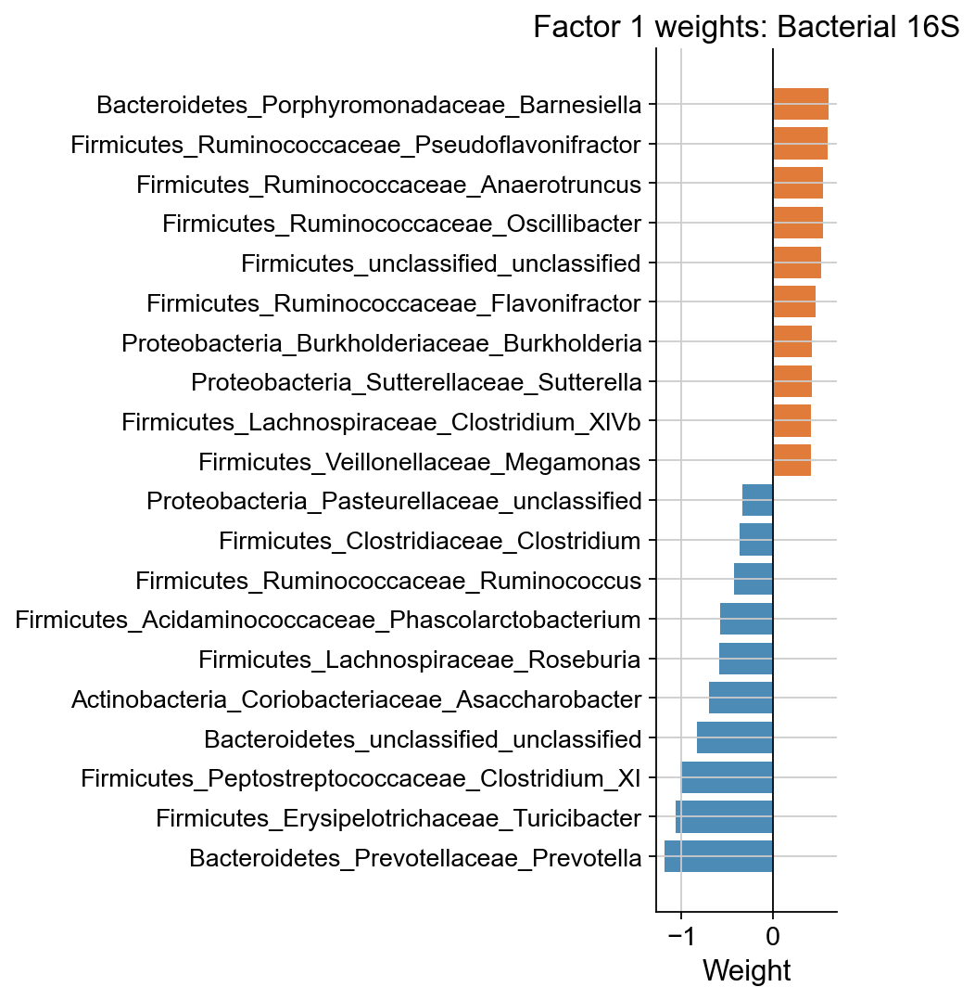

In [541]:
# === Factor 1 bacterial loadings: top 10 positive + top 10 negative ===
bact_view_idx = list(bt_views.keys()).index("Bacterial 16S")
bact_features = list(bt_views["Bacterial 16S"].columns)
w_bact_f1 = pd.Series(W_bt[bact_view_idx][:, 0], index=bact_features)

top_n = 10
top_pos = w_bact_f1.nlargest(top_n)
top_neg = w_bact_f1.nsmallest(top_n)
top_combined = pd.concat([top_pos, top_neg]).sort_values()

fig, ax = plt.subplots(figsize=(6, 7))
colors = ["#E07B3A" if v > 0 else "#4C8BB5" for v in top_combined.values]
ax.barh(top_combined.index, top_combined.values, color=colors)
ax.axvline(0, color="black", lw=0.8)
ax.set_xlabel("Weight", fontsize=14)
ax.set_title("Factor 1 weights: Bacterial 16S", fontsize=15)
ax.tick_params(axis="y", labelsize=12)
ax.tick_params(axis="x", labelsize=13)
ax.spines[["top", "right"]].set_visible(False)
plt.tight_layout()
plt.show()


=== MOFA Factor ~ Donor (Kruskal-Wallis) ===
  Factor1: H=9.667, p=0.0216
  Factor2: H=10.385, p=0.0156
  Factor3: H=9.462, p=0.0237
  Factor4: H=1.154, p=0.7641
  Factor5: H=0.128, p=0.9883
  Factor6: H=5.769, p=0.1234
  Factor7: H=6.590, p=0.0862
  Factor8: H=0.846, p=0.8384

=== MOFA Factor ~ Region (Kruskal-Wallis) ===
  Factor1: H=0.615, p=0.7351
  Factor2: H=0.154, p=0.9260
  Factor3: H=0.731, p=0.6939
  Factor4: H=2.000, p=0.3679
  Factor5: H=6.500, p=0.0388
  Factor6: H=1.654, p=0.4374
  Factor7: H=2.577, p=0.2757
  Factor8: H=0.462, p=0.7939

Top 3 factors by total R²: ['Factor1', 'Factor2', 'Factor3']

--- Factor1 ~ donor (unrestricted permutation) ---


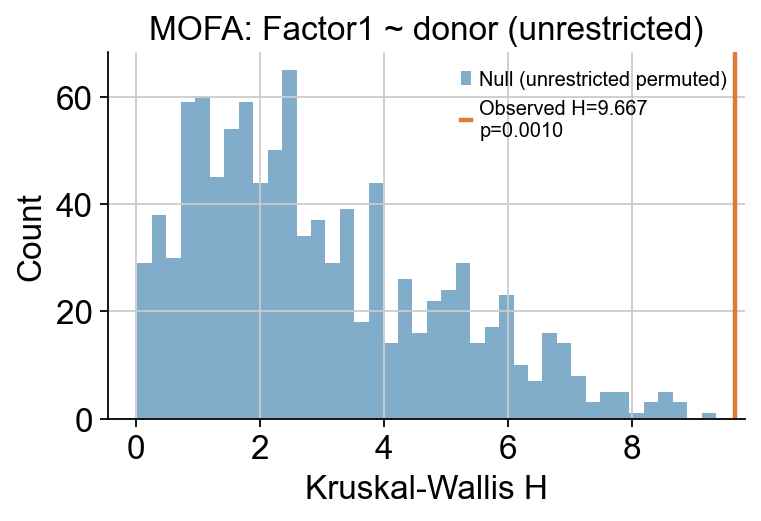

Observed H : 9.6667
p-value (unrestricted, 1000 perms): 0.0010

--- Factor2 ~ donor (unrestricted permutation) ---


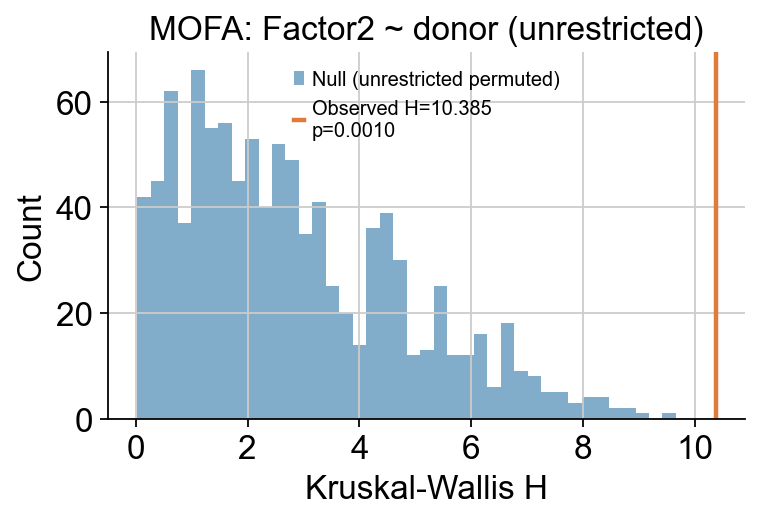

Observed H : 10.3846
p-value (unrestricted, 1000 perms): 0.0010

--- Factor3 ~ donor (unrestricted permutation) ---


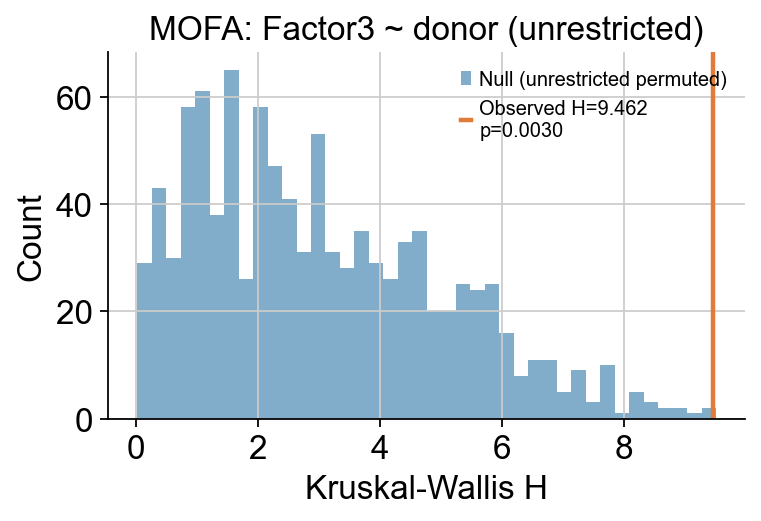

Observed H : 9.4615
p-value (unrestricted, 1000 perms): 0.0030

--- Factor1 ~ region (within-donor permutation) ---


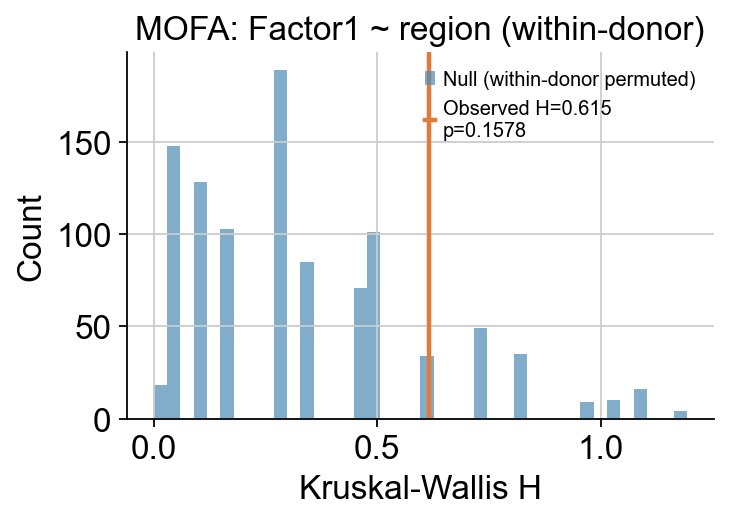

Observed H : 0.6154
p-value (within-donor, 1000 perms): 0.1578

--- Factor2 ~ region (within-donor permutation) ---


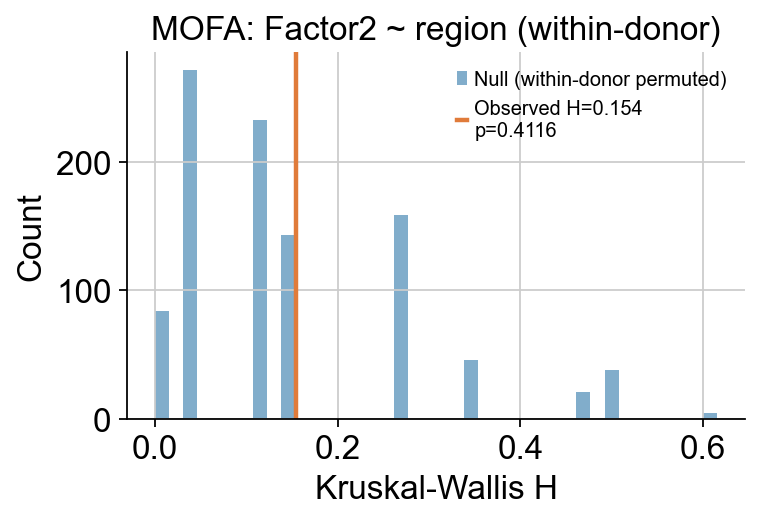

Observed H : 0.1538
p-value (within-donor, 1000 perms): 0.4116

--- Factor3 ~ region (within-donor permutation) ---


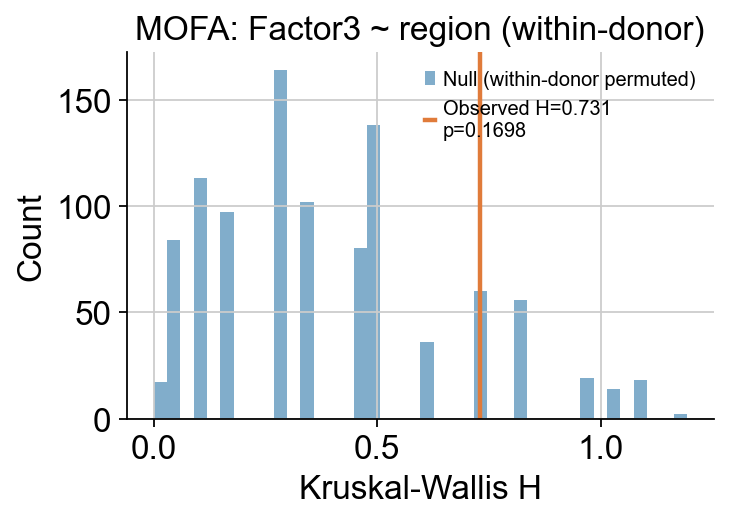

Observed H : 0.7308
p-value (within-donor, 1000 perms): 0.1698

=== MOFA permutation summary ===
         donor_H_obs  donor_pval  region_H_obs  region_pval_within_donor
factor                                                                  
Factor1       9.6667       0.001        0.6154                    0.1578
Factor2      10.3846       0.001        0.1538                    0.4116
Factor3       9.4615       0.003        0.7308                    0.1698


In [542]:
# === Permutation tests: how donor- vs region-driven is each factor? ===
print("=== MOFA Factor ~ Donor (Kruskal-Wallis) ===")
for col in [c for c in factor_df_bt.columns if c.startswith("Factor")]:
    groups = [grp[col].values for _, grp in factor_df_bt.groupby("donor")]
    if any(len(g) < 2 for g in groups): continue
    stat, pval = kruskal(*groups)
    print(f"  {col}: H={stat:.3f}, p={pval:.4f}")

print("\n=== MOFA Factor ~ Region (Kruskal-Wallis) ===")
for col in [c for c in factor_df_bt.columns if c.startswith("Factor")]:
    groups = [grp[col].values for _, grp in factor_df_bt.groupby("region")]
    if any(len(g) < 2 for g in groups): continue
    stat, pval = kruskal(*groups)
    print(f"  {col}: H={stat:.3f}, p={pval:.4f}")

top_factors_bt = r2_bt_df.sum(axis=0).nlargest(3).index.tolist()
print(f"\nTop 3 factors by total R²: {top_factors_bt}")

perm_results_bt = {}
for f in top_factors_bt:
    print(f"\n--- {f} ~ donor (unrestricted permutation) ---")
    perm_results_bt[(f, "donor")] = mofa_permutation_test(
        factor_df_bt, factor_col=f, group_col="donor",
        mode="unrestricted", n_perm=1000, seed=0, title_prefix="MOFA",
    )
for f in top_factors_bt:
    print(f"\n--- {f} ~ region (within-donor permutation) ---")
    perm_results_bt[(f, "region")] = mofa_permutation_test(
        factor_df_bt, factor_col=f, group_col="region",
        mode="within_donor", n_perm=1000, seed=0, title_prefix="MOFA",
    )

summary_bt = pd.DataFrame([
    {
        "factor": f,
        "donor_H_obs":  perm_results_bt[(f, "donor")]["observed_h"],
        "donor_pval":   perm_results_bt[(f, "donor")]["pval"],
        "region_H_obs": perm_results_bt[(f, "region")]["observed_h"],
        "region_pval_within_donor": perm_results_bt[(f, "region")]["pval"],
    }
    for f in top_factors_bt
]).set_index("factor")
print("\n=== MOFA permutation summary ===")
print(summary_bt.round(4))


In [543]:
# === Export top 10 positive-weight bacteria per MOFA factor ===
bact_view_idx = list(bt_views.keys()).index("Bacterial 16S")
W_bact = W_bt[bact_view_idx]
bact_features = list(bt_views["Bacterial 16S"].columns)

top_n = 10
records = []
for f_idx in range(n_factors_bt):
    factor_label = f"Factor{f_idx + 1}"
    w = pd.Series(W_bact[:, f_idx], index=bact_features)
    top = w[w > 0].nlargest(top_n)
    for rank, (taxon, weight) in enumerate(top.items(), start=1):
        records.append({
            "factor": factor_label,
            "rank":   rank,
            "taxon":  taxon,
            "weight": weight,
        })

top_bacteria_df = pd.DataFrame(records)
csv_path = "MOFA_top10_bacteria_per_factor.csv"
top_bacteria_df.to_csv(csv_path, index=False)
print(f"Saved {len(top_bacteria_df)} rows to {csv_path}")

# Wide view: rank × factor matrix of "taxon (weight)"
wide = top_bacteria_df.assign(
    label=lambda d: d["taxon"] + " (" + d["weight"].round(3).astype(str) + ")"
).pivot(index="rank", columns="factor", values="label")
print("\nTop 10 positive-weight bacteria per factor (rank × factor):")
wide


Saved 80 rows to /Users/lc1415/Desktop/MITBE/classes/20.440/project/MOFA_top10_bacteria_per_factor.csv

Top 10 positive-weight bacteria per factor (rank × factor):


factor,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8
rank,,,,,,,,
1,Bacteroidetes_Porphyromonadaceae_Barnesiella (...,Bacteroidetes_Prevotellaceae_unclassified (1.222),Firmicutes_Clostridiales_unclassified (1.56),Actinobacteria_Coriobacteriaceae_Asaccharobact...,Firmicutes_Lachnospiraceae_unclassified (0.002),Firmicutes_Lachnospiraceae_Clostridium_XlVa (0...,Bacteroidetes_Porphyromonadaceae_Odoribacter (...,Bacteroidetes_unclassified_unclassified (0.196)
2,Firmicutes_Ruminococcaceae_Pseudoflavonifracto...,Proteobacteria_Enterobacteriaceae_unclassified...,Firmicutes_Lachnospiraceae_Clostridium_XlVb (1...,Bacteroidetes_unclassified_unclassified (0.002),Firmicutes_Clostridiales_unclassified (0.001),Firmicutes_Ruminococcaceae_Pseudoflavonifracto...,Bacteroidetes_Porphyromonadaceae_unclassified ...,Actinobacteria_Propionibacteriaceae_Propioniba...
3,Firmicutes_Ruminococcaceae_Anaerotruncus (0.557),Proteobacteria_Enterobacteriaceae_Escherichia ...,Proteobacteria_Sutterellaceae_Parasutterella (...,Bacteroidetes_Porphyromonadaceae_unclassified ...,Firmicutes_Streptococcaceae_Streptococcus (0.001),Firmicutes_Lachnospiraceae_Coprococcus (0.621),Proteobacteria_Desulfovibrionaceae_Desulfovibr...,Bacteroidetes_Porphyromonadaceae_Odoribacter (...
4,Firmicutes_Ruminococcaceae_Oscillibacter (0.554),Firmicutes_Veillonellaceae_Megamonas (1.174),Firmicutes_Streptococcaceae_Streptococcus (1.302),Firmicutes_Clostridiales_unclassified (0.001),Firmicutes_Lachnospiraceae_Clostridium_XlVb (0...,Bacteroidetes_Porphyromonadaceae_unclassified ...,Bacteroidetes_unclassified_unclassified (1.808),Proteobacteria_Desulfovibrionaceae_Desulfovibr...
5,Firmicutes_unclassified_unclassified (0.532),Proteobacteria_Sutterellaceae_Sutterella (1.072),Firmicutes_Acidaminococcaceae_Phascolarctobact...,Firmicutes_Ruminococcaceae_unclassified (0.001),Firmicutes_Ruminococcaceae_unclassified (0.001),Firmicutes_Peptostreptococcaceae_Clostridium_X...,Bacteroidetes_Rikenellaceae_Alistipes (1.492),Firmicutes_Ruminococcaceae_Subdoligranulum (0....
6,Firmicutes_Ruminococcaceae_Flavonifractor (0.476),Firmicutes_Erysipelotrichaceae_unclassified (0...,Firmicutes_Lachnospiraceae_incertae_sedis (0.814),Proteobacteria_Desulfovibrionaceae_Bilophila (...,Firmicutes_Acidaminococcaceae_Phascolarctobact...,Actinobacteria_Propionibacteriaceae_Propioniba...,Bacteroidetes_Prevotellaceae_Paraprevotella (1...,Bacteroidetes_Porphyromonadaceae_unclassified ...
7,Proteobacteria_Burkholderiaceae_Burkholderia (...,Bacteroidetes_Porphyromonadaceae_Barnesiella (...,Bacteroidetes_Rikenellaceae_Alistipes (0.655),Firmicutes_Ruminococcaceae_Faecalibacterium (0...,Proteobacteria_Desulfovibrionaceae_Bilophila (...,Actinobacteria_Coriobacteriaceae_unclassified ...,Firmicutes_Ruminococcaceae_Oscillibacter (1.273),Bacteroidetes_Prevotellaceae_Paraprevotella (0...
8,Proteobacteria_Sutterellaceae_Sutterella (0.426),Proteobacteria_Desulfovibrionaceae_Desulfovibr...,Firmicutes_Lachnospiraceae_Coprococcus (0.627),Firmicutes_Peptostreptococcaceae_Clostridium_X...,Firmicutes_Lachnospiraceae_Roseburia (0.0),Firmicutes_Ruminococcaceae_Anaerotruncus (0.281),Proteobacteria_Comamonadaceae_Pelomonas (1.212),Firmicutes_Lachnospiraceae_Clostridium_XlVa (0...
9,Firmicutes_Lachnospiraceae_Clostridium_XlVb (0...,Bacteroidetes_Prevotellaceae_Prevotella (0.466),Firmicutes_Lachnospiraceae_Roseburia (0.561),Firmicutes_Lachnospiraceae_Coprococcus (0.001),Firmicutes_Ruminococcaceae_Flavonifractor (0.0),Firmicutes_unclassified_unclassified (0.264),Bacteroidetes_Porphyromonadaceae_Parabacteroid...,Proteobacteria_Burkholderiales_unclassified (0.1)


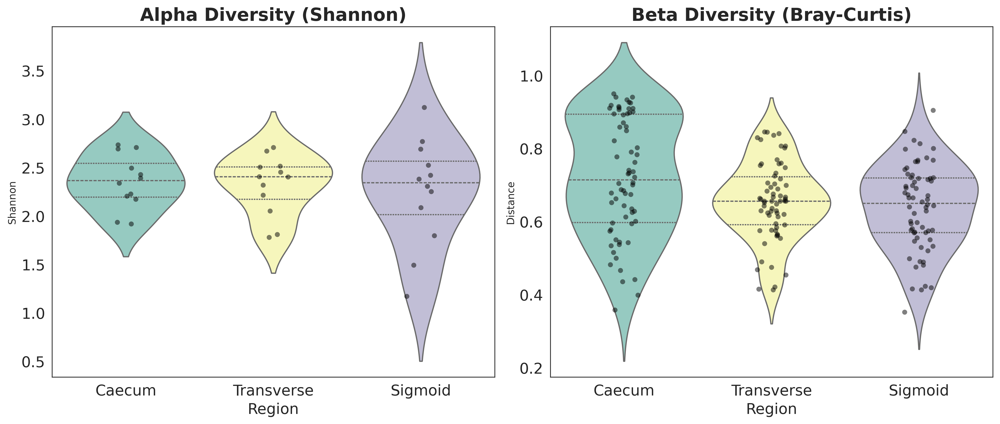

✅ Data exported for biomarkers: /content/drive/MyDrive/Colab Notebooks/20.440/full_detailed_microbiome_abundances.csv


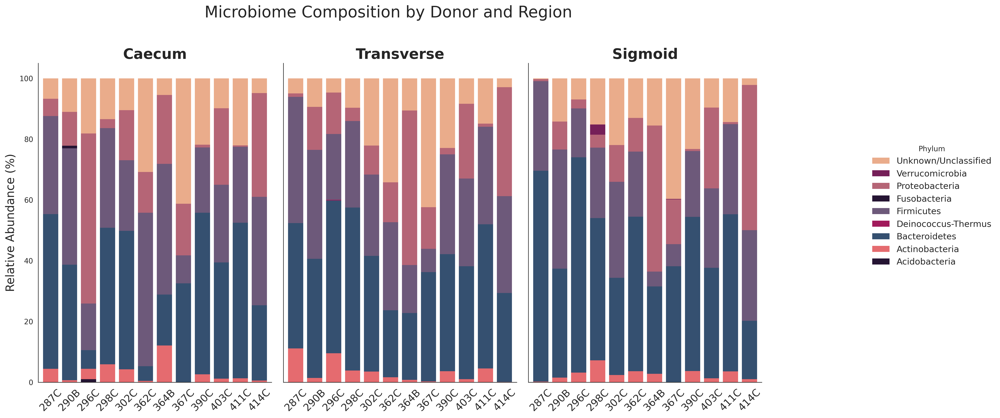

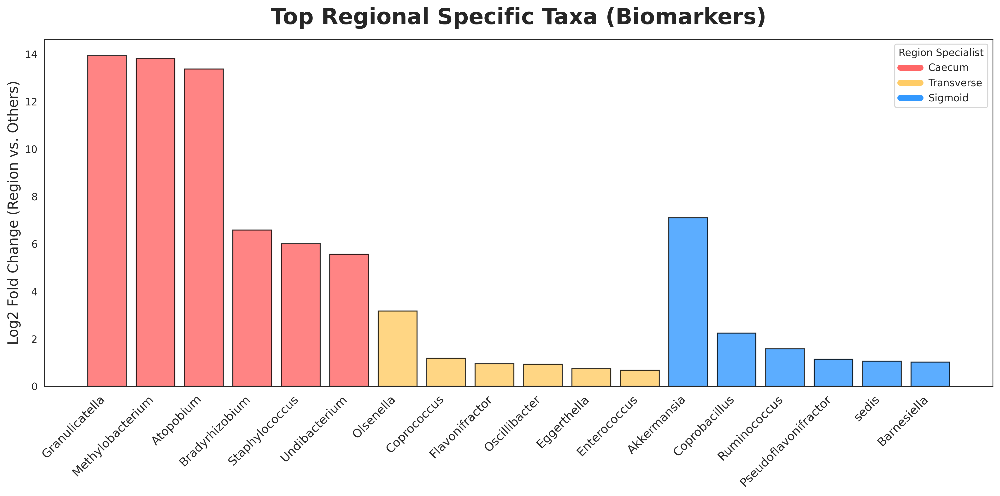

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from scipy.spatial.distance import pdist
from matplotlib.lines import Line2D

FILE_PATH = "data/supplemental_data_edited.xlsx"
OUTPUT_DIR = os.path.dirname(FILE_PATH)
CSV_EXPORT_PATH = os.path.join(OUTPUT_DIR, "full_detailed_microbiome_abundances.csv")

plt.rcParams["figure.dpi"] = 300
plt.rcParams["savefig.dpi"] = 300
sns.set_style("white")

def prepare_data():
    """Loads and transforms microbiome data with consistent taxonomy and metadata."""
    if not os.path.exists(FILE_PATH):
        raise FileNotFoundError(f"File not found: {FILE_PATH}")

    # Load 16S Abundance Sheet
    df = pd.read_excel(FILE_PATH, sheet_name='Table S2b')
    tax_col = df.columns[0]
    df = df.rename(columns={tax_col: 'Taxonomy'})

    df_melt = df.melt(id_vars=['Taxonomy'], var_name='SampleID', value_name='Abundance')

    def get_region(sid):
        sid_l = str(sid).lower()
        if 'caecum' in sid_l: return 'Caecum'
        if 'transv' in sid_l or 'transverse' in sid_l: return 'Transverse'
        if 'sigmoid' in sid_l: return 'Sigmoid'
        return None

    df_melt['Region'] = df_melt['SampleID'].apply(get_region)
    df_melt = df_melt.dropna(subset=['Region'])
    df_melt['Donor'] = df_melt['SampleID'].apply(lambda x: str(x).split('_')[0].upper())

    def clean_phylum(tax):
        t = str(tax).lower()
        if 'unknown' in t or 'unclassified' in t or t == 'nan':
            return 'Unknown/Unclassified'
        return str(tax).split('_')[0]

    df_melt['Phylum'] = df_melt['Taxonomy'].apply(clean_phylum)
    df_melt['GenusSpecies'] = df_melt['Taxonomy'].apply(lambda x: str(x).split('_')[-1] if '_' in str(x) else x)

    return df_melt

def plot_diversity_metrics(df):
    """Calculates and plots Shannon Index and Bray-Curtis Distances."""
    def shannon_div(vals):
        p = vals / vals.sum()
        p = p[p > 0]
        return -np.sum(p * np.log(p))

    alpha_df = df.groupby(['SampleID', 'Region'])['Abundance'].apply(shannon_div).reset_index(name='Shannon')

    pivot = df.pivot_table(index='SampleID', columns='Taxonomy', values='Abundance', fill_value=0)
    sample_info = df[['SampleID', 'Region']].drop_duplicates().set_index('SampleID')

    beta_list = []
    regions = ['Caecum', 'Transverse', 'Sigmoid']
    for r in regions:
        sids = sample_info[sample_info['Region'] == r].index
        r_data = pivot.loc[pivot.index.intersection(sids)]
        if len(r_data) > 1:
            dists = pdist(r_data.values, metric='braycurtis')
            for d in dists: beta_list.append({'Region': r, 'Distance': d})
    beta_df = pd.DataFrame(beta_list)

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    FS = 15

    sns.violinplot(data=alpha_df, x='Region', y='Shannon', ax=axes[0], order=regions, palette='Set3', inner='quartile')
    sns.stripplot(data=alpha_df, x='Region', y='Shannon', ax=axes[0], order=regions, color='black', alpha=0.5)
    axes[0].set_title("Alpha Diversity (Shannon)", fontsize=18, fontweight='bold')

    sns.violinplot(data=beta_df, x='Region', y='Distance', ax=axes[1], order=regions, palette='Set3', inner='quartile')
    sns.stripplot(data=beta_df, x='Region', y='Distance', ax=axes[1], order=regions, color='black', alpha=0.5)
    axes[1].set_title("Beta Diversity (Bray-Curtis)", fontsize=18, fontweight='bold')

    for ax in axes:
        ax.set_xlabel("Region", fontsize=FS)
        ax.tick_params(labelsize=FS)

    plt.tight_layout()
    plt.show()

def plot_phylum_composition(df):
    """Generates stacked bar charts of relative phylum abundance."""
    full_export = df.pivot_table(index='Taxonomy', columns=['Region', 'Donor'], values='Abundance', fill_value=0)
    full_export.to_csv(CSV_EXPORT_PATH)
    print(f"Data exported: {CSV_EXPORT_PATH}")

    plot_rel = df.groupby(['Region', 'Donor', 'Phylum'])['Abundance'].sum().unstack(fill_value=0)
    plot_rel = plot_rel.div(plot_rel.sum(axis=1), axis=0) * 100

    cols = sorted([c for c in plot_rel.columns if c != 'Unknown/Unclassified'])
    if 'Unknown/Unclassified' in plot_rel.columns:
        cols.append('Unknown/Unclassified')
    plot_df = plot_rel[cols]

    base_colors = {'Bacteroidetes': '#355070', 'Firmicutes': '#6d597a', 'Proteobacteria': '#b56576',
                   'Actinobacteria': '#e56b6f', 'Unknown/Unclassified': '#eaac8b'}

    final_palette = [base_colors.get(ph, sns.color_palette("rocket", n_colors=len(cols))[i % 5]) for i, ph in enumerate(cols)]

    regions = ['Caecum', 'Transverse', 'Sigmoid']
    fig, axes = plt.subplots(1, 3, figsize=(18, 8), sharey=True, gridspec_kw={'wspace': 0.05})

    for i, region in enumerate(regions):
        ax = axes[i]
        if region in plot_df.index.get_level_values('Region'):
            region_data = plot_df.xs(region, level='Region')
            region_data.plot(kind='bar', stacked=True, ax=ax, color=final_palette, edgecolor='none', width=0.8, legend=False)

            ax.set_title(region, fontsize=20, fontweight='bold')
            ax.tick_params(axis='x', rotation=45, labelsize=14)
            ax.set_xlabel("")
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)

    axes[0].set_ylabel("Relative Abundance (%)", fontsize=16)
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles[::-1], labels[::-1], title="Phylum", bbox_to_anchor=(1.01, 0.7), loc='upper left', frameon=False, fontsize=12)

    plt.suptitle("Microbiome Composition by Donor and Region", fontsize=22, y=1.02)
    plt.show()

def plot_regional_biomarkers(csv_path):
    """Calculates Log2 Fold Change to identify taxa specialized for specific regions."""
    df = pd.read_csv(csv_path, header=[0, 1], index_col=0)
    means = df.groupby(level=0, axis=1).mean()
    regions = ['Caecum', 'Transverse', 'Sigmoid']
    means = means[regions]

    means_f = means[~means.index.str.contains('unclassified|unknown', case=False)]
    eps = 1e-5
    region_colors = {'Caecum': '#ff6666', 'Transverse': '#ffcc66', 'Sigmoid': '#3399ff'}

    all_specialists = []
    for reg in regions:
        others = [r for r in regions if r != reg]
        other_mean = means_f[others].mean(axis=1)
        lfc = np.log2((means_f[reg] + eps) / (other_mean + eps))

        # Select top taxa with > 0.1% abundance in target region
        valid_taxa = means_f[means_f[reg] > 0.1].index
        top_6 = lfc.loc[valid_taxa].sort_values(ascending=False).head(6)

        for taxon, val in top_6.items():
            all_specialists.append({'Taxon': taxon.split('_')[-1], 'LFC': val, 'Region': reg, 'Color': region_colors[reg]})

    plot_df = pd.DataFrame(all_specialists)

    fig, ax = plt.subplots(figsize=(14, 7))
    ax.bar(plot_df['Taxon'], plot_df['LFC'], color=plot_df['Color'], edgecolor='black', alpha=0.8)
    ax.axhline(0, color='black', linewidth=1.2)

    ax.set_ylabel('Log2 Fold Change (Region vs. Others)', fontsize=14)
    ax.set_title('Top Regional Specific Taxa (Biomarkers)', fontsize=22, pad=15, fontweight='bold')
    plt.xticks(rotation=45, ha='right', fontsize=12)

    legend_elements = [Line2D([0], [0], color=c, lw=6, label=r) for r, c in region_colors.items()]
    ax.legend(handles=legend_elements, title="Region Specialist", loc='upper right', frameon=True)

    plt.tight_layout()
    plt.show()

microbiome_data = prepare_data()
plot_diversity_metrics(microbiome_data)
plot_phylum_composition(microbiome_data)
plot_regional_biomarkers(CSV_EXPORT_PATH)

--- Data Summary ---
Unique Donors in file: ['290B' '302C' '298C']
Unique Isotypes in file: ['IgA' 'IgG']
Total rows: 903335


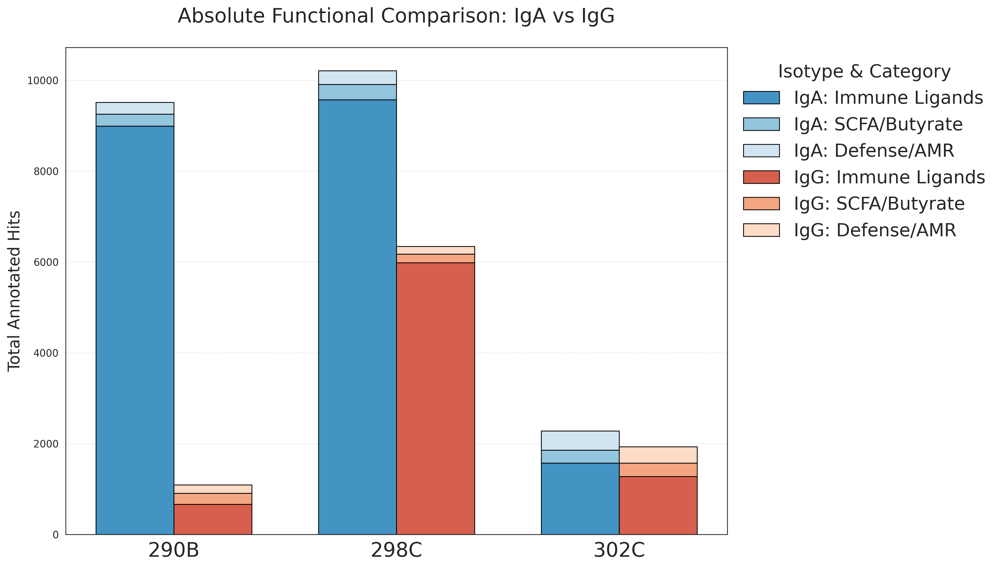

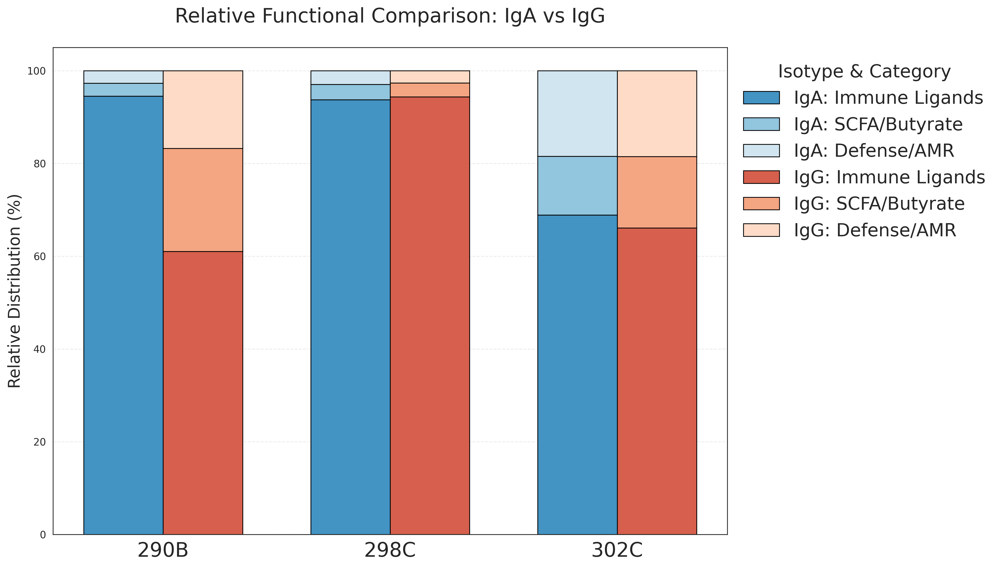

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import warnings

warnings.filterwarnings('ignore')

IGA_SHADES = ['#4393C3', '#92C5DE', '#D1E5F0']
IGG_SHADES = ['#D6604D', '#F4A582', '#FDDBC7']

DONORS = ['290B', '298C', '302C']
ISOTYPES = ['IgA', 'IgG']
MASTER_FILE = "data/eggnog_annotations.tsv"

PATTERNS = {
    'Immune Ligands': "Flagellin|Sortase|Fimbriae|Pilin|Pili|Outer Membrane|OMP|Invasin|Adhesin|Lipoprotein",
    'SCFA/Butyrate': "K00626|K00074|K01715|K00248|K00929|K00634|K01034|K01035|K00627|K01895|K01026",
    'Defense/AMR': "K07451|K03427|K09951|K09952|K18918|K07171|K01467|K18733|K03327|K18138"
}

def load_all_data():
    path = MASTER_FILE
    if not os.path.exists(path):
        print(f"Error: {path} not found.")
        return pd.DataFrame()

    df = pd.read_csv(path, sep='\t', on_bad_lines='skip')

    df.columns = [c.lower() for c in df.columns]

    if 'donor' not in df.columns or 'isotype' not in df.columns:
        print(f"Column Error! Found columns: {df.columns.tolist()}")
        return pd.DataFrame()

    df['donor'] = df['donor'].astype(str).str.strip()
    df['isotype'] = df['isotype'].astype(str).str.strip()
    return df[['donor', 'isotype', 'raw_text']]

def plot_functional_comparison(df, relative=False):
    categories = list(PATTERNS.keys())
    data_list = []

    for donor in DONORS:
        for iso in ISOTYPES:
            mask = (df['donor'].str.upper() == donor.upper()) & (df['isotype'].str.upper() == iso.upper())
            sub_df = df[mask]

            row = {'Donor': donor, 'Isotype': iso}
            total_hits = 0

            for cat, pattern in PATTERNS.items():
                count = sub_df['raw_text'].str.contains(pattern, na=False, case=False).sum()
                row[cat] = count
                total_hits += count

            if relative and total_hits > 0:
                for cat in categories:
                    row[cat] = (row[cat] / total_hits) * 100
            data_list.append(row)

    counts_df = pd.DataFrame(data_list)

    if counts_df[categories].sum().sum() == 0:
        print(f"Warning: No hits found for patterns in {('Relative' if relative else 'Absolute')} mode.")
        return

    fig, ax = plt.subplots(figsize=(14, 8))
    x = np.arange(len(DONORS))
    bar_width = 0.35

    bottom_iga = np.zeros(len(DONORS))
    iga_data = counts_df[counts_df['Isotype'] == 'IgA']
    for i, cat in enumerate(categories):
        vals = iga_data[cat].values
        ax.bar(x - bar_width/2, vals, bar_width, bottom=bottom_iga,
               label=f"IgA: {cat}", color=IGA_SHADES[i], edgecolor='black', linewidth=0.8)
        bottom_iga += vals

    bottom_igg = np.zeros(len(DONORS))
    igg_data = counts_df[counts_df['Isotype'] == 'IgG']
    for i, cat in enumerate(categories):
        vals = igg_data[cat].values
        ax.bar(x + bar_width/2, vals, bar_width, bottom=bottom_igg,
               label=f"IgG: {cat}", color=IGG_SHADES[i], edgecolor='black', linewidth=0.8)
        bottom_igg += vals

    ylabel = 'Relative Distribution (%)' if relative else 'Total Annotated Hits'
    ax.set_ylabel(ylabel, fontsize=16)
    title_prefix = 'Relative' if relative else 'Absolute'
    ax.set_title(f'{title_prefix} Functional Comparison: IgA vs IgG', fontsize=20, pad=25)
    ax.set_xticks(x)
    ax.set_xticklabels(DONORS, fontsize=20)

    leg = ax.legend(loc='upper left', bbox_to_anchor=(1, 1), frameon=False,
                    title="Isotype & Category", fontsize=18)
    leg.get_title().set_fontsize(18)
    leg.get_title().set_weight('normal')

    plt.grid(axis='y', linestyle='--', alpha=0.4)
    plt.tight_layout()
    plt.show()

full_df = load_all_data()
if not full_df.empty:
    plot_functional_comparison(full_df, relative=False)
    plot_functional_comparison(full_df, relative=True)
else:
    print("Dataframe is empty. Check file path or content.")

# Aim 1 exploration: further cluster B cells

In [471]:
adata_bcells

NameError: name 'adata_bcells' is not defined

In [ ]:
# Re-cluster B cells at higher resolution to find sub-types beyond the original 5
# Recompute PCA/neighbors on the B cell subset so clusters reflect B-cell-intrinsic variance
adata_bcells = adata[adata.obs["cell_type"].isin(["B cell IgG Plasma", "B cell IgA Plasma"]) & (adata.obs["percent_mito"] < 0.05)].copy()    
sc.pp.normalize_total(adata_bcells, target_sum=1e4)
sc.pp.log1p(adata_bcells)
sc.pp.highly_variable_genes(adata_bcells, n_top_genes=2000)
sc.pp.scale(adata_bcells, max_value=10)
sc.tl.pca(adata_bcells, n_comps=30)
sc.pp.neighbors(adata_bcells, n_neighbors=15, n_pcs=20)
sc.tl.umap(adata_bcells)

sc.tl.leiden(adata_bcells, resolution=0.3, key_added=f"leiden_r0.3")

/Users/lc1415/anaconda3/envs/scanpy/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


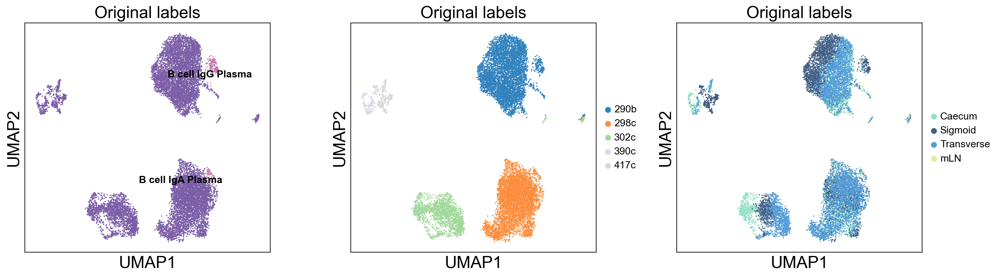

In [ ]:
# Final UMAP at chosen resolution r=0.3
fig, axes = plt.subplots(1, 3, figsize=(17, 5))

sc.pl.umap(adata_bcells, color="cell_type",
           title="Cell type", show=False,
           legend_loc="on data", legend_fontsize=12, ax=axes[0])

sc.pl.umap(adata_bcells, color="donor",
           title="Donor", show=False,legend_fontsize=12, ax=axes[1])

sc.pl.umap(adata_bcells, color="region",
           title="Region", show=False,legend_fontsize=12, ax=axes[2])

plt.tight_layout()
plt.show()
